In [1]:
import pandas as pd
import numpy as np
import os, re, sys
from matplotlib import pyplot as plt
import networkx as nx
import pickle as pk


sys.path.append(os.path.abspath(os.path.join(os.path.dirname("../"), os.pardir)))
from customFunctions.utils import *

In [2]:
mithril_features = pd.read_csv("../checkpoints/mithril_features.csv", sep="\t", index_col="Mithril_id")
mithril_features

,PhastCons_100V,PhyloP_100V,MLC_score,ss_distorsion,ddG,ref_frequency,alt_frequency,coverage,entropy,conservation_blocks,PWM_score,Human_MSA_position,bulge,stem,hairpin,loop,unpaired_frequency,closest_modification,closest_modification_2D,OEUF_score
Mithril_id,,,,,,,,,,,,,,,,,,,,
MITHRIL.1728,1.000,3.724,0.117871,0.028169,3.8,0.832225,0.143385,1.0,0.769628,14.0,-0.802033,0,0,1,0,0,0.011603,8,8.0,0.470
MITHRIL.1729,1.000,3.724,0.117871,0.028169,3.7,0.832225,0.004435,1.0,0.769628,14.0,-5.816984,0,0,1,0,0,0.011603,8,8.0,0.470
MITHRIL.1730,1.000,3.724,0.117871,0.028169,3.7,0.832225,0.019956,1.0,0.769628,14.0,-3.647059,0,0,1,0,0,0.011603,8,8.0,0.470
MITHRIL.1731,0.989,1.697,0.128976,0.028169,4.3,0.509978,0.005174,1.0,1.096296,10.0,-5.594591,1,0,1,0,0,0.014503,7,7.0,0.358
MITHRIL.1732,0.989,1.697,0.128976,0.028169,4.3,0.509978,0.477458,1.0,1.096296,10.0,0.933444,1,0,1,0,0,0.014503,7,7.0,0.358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MITHRIL.48239,1.000,3.604,0.738729,0.000000,0.7,0.956554,0.023564,1.0,0.316291,14.0,-3.407268,1,0,1,0,0,0.009386,7,5.0,0.358
MITHRIL.48240,1.000,3.604,0.738729,0.029412,4.7,0.956554,0.004418,1.0,0.316291,14.0,-5.822305,1,0,1,0,0,0.009386,7,5.0,0.358
MITHRIL.48241,1.000,5.938,0.734021,0.000000,1.9,0.981591,0.012518,1.0,0.154686,14.0,-4.319805,0,0,1,0,0,0.003610,8,6.0,0.470


In [3]:
mithril_predictions = pd.read_csv("../checkpoints/tAPOGEE_predictions.csv", sep="\t", index_col="Mithril_id")[["tAPOGEE_score", "tAPOGEE_oob_score", "tAPOGEE_posterior", "category"]]
mithril_predictions.loc[mithril_predictions.tAPOGEE_oob_score.isna(), "tAPOGEE_oob_score"] = mithril_predictions.tAPOGEE_score
mithril_predictions["tAPOGEE_quantile"] = pd.qcut(
    mithril_predictions.tAPOGEE_oob_score,
    np.linspace(0,1,101),
    labels=np.linspace(0,1,101)[:-1]
)
mithril_predictions

,tAPOGEE_score,tAPOGEE_oob_score,tAPOGEE_posterior,category,tAPOGEE_quantile
Mithril_id,,,,,
MITHRIL.1728,0.780641,0.780641,0.994751,pathogenic,0.90
MITHRIL.1729,0.703568,0.703568,0.951709,likely pathogenic,0.77
MITHRIL.1730,0.767472,0.767472,0.991911,pathogenic,0.88
MITHRIL.1731,0.520965,0.520965,0.320783,VUS,0.46
MITHRIL.1732,0.632326,0.632326,0.791225,VUS,0.64
...,...,...,...,...,...
MITHRIL.48239,0.665709,0.665709,0.887440,VUS,0.70
MITHRIL.48240,0.773280,0.773280,0.993295,pathogenic,0.88
MITHRIL.48241,0.841406,0.834604,0.999351,pathogenic,0.97


In [4]:
embedding = pd.read_csv("../data/Mithril_msm_embedding.csv", index_col=0)
embedding.index.name = "Mithril_id"
embedding.columns = "channel_"+embedding.columns.astype(str)
embedding

,channel_0,channel_1,channel_2,channel_3,channel_4,channel_5,channel_6,channel_7,channel_8,channel_9,...,channel_758,channel_759,channel_760,channel_761,channel_762,channel_763,channel_764,channel_765,channel_766,channel_767
Mithril_id,,,,,,,,,,,,,,,,,,,,,
MITHRIL.1728,-0.046571,-0.464829,-1.071173,0.706031,0.254538,-0.839300,-0.785148,-0.686940,-0.066750,-0.083101,...,0.703984,-0.094465,0.001146,-0.474778,0.054920,0.746596,-0.846664,0.056164,0.580686,-0.568011
MITHRIL.1729,-0.094558,-0.843313,-0.774938,0.836958,-0.283595,-0.961378,-0.578084,-0.701949,0.039039,-0.158005,...,0.391420,-0.352180,0.091886,-0.714017,0.015839,0.481953,-0.791229,0.398780,0.376998,0.029397
MITHRIL.1730,0.050315,-0.794720,-0.958813,0.551639,-0.071321,-0.767290,-0.558026,-0.843187,0.249865,-0.380568,...,0.306507,-0.153325,0.306693,-0.223419,-0.042577,0.929070,-0.781954,0.641456,0.126171,0.083980
MITHRIL.1731,-0.271729,-0.401465,-0.722368,0.715860,-0.171587,-0.678559,-0.540892,-0.339579,-0.256668,-0.268223,...,0.985569,0.165077,-0.349262,-0.658368,-0.430892,-0.193119,-0.840392,-0.930292,0.894584,-0.970570
MITHRIL.1732,-0.189935,-0.290123,-0.115013,0.859563,-0.127386,-0.715655,-0.411798,-0.926073,-0.151554,-0.170612,...,1.006938,-0.278918,-0.724813,-0.523815,-0.416955,0.000319,-1.031683,-0.880209,1.119973,-0.960705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MITHRIL.48239,0.085203,0.720789,0.258117,-0.241561,0.276256,0.001175,0.117050,-0.357717,0.238088,0.165467,...,-0.069218,0.467677,-0.082058,0.037380,0.941805,-0.044995,-0.369644,0.526498,-0.601754,-0.447180
MITHRIL.48240,-0.516000,0.442102,0.331330,0.229251,-0.081880,-0.531516,0.226194,-0.564276,0.209845,-0.133919,...,-0.124533,0.285401,-0.201929,-0.403190,0.809152,0.175132,-0.162785,0.336191,-0.763395,-0.056434
MITHRIL.48241,0.318094,0.357954,-0.837745,-0.545639,-0.157910,0.394076,-1.226594,-0.005673,0.406269,-0.306028,...,-0.098943,0.436399,0.025024,1.110456,-0.265077,0.567142,-0.822745,-0.657988,-0.763098,-0.291456


In [ ]:
X = mithril_features.join(embedding)
X.shape

(4521, 788)

In [6]:
tuned_model_svc = pk.load(open("../checkpoints/candidate_models/model_svc.pk", "rb"))
tuned_model_svc

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('input_selection',
                                        ColumnTransformerDF(transformers=[('feature_selection',
                                                                           SelectFromModelDF(estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                                                                              random_state=777),
                                                                                             threshold=0.01),
                                                                           Index(['PhastCons_100V', 'PhyloP_100V', 'MLC_score', 'ss_distorsion', '...
                                                                       scoring_function=<function roc_auc_score at 0x79e57562d9e0>))]),
             n_jobs=1,
             param_grid={'channels_correlation_filter__corr_threshold': [0.2,
                                                                         0.25,
                                                                         0.3,
                                                                         0.4],
                         'channels_pca__n_components': [1, 2, 3, 5],
                         'input_selection__channel_selection__alpha': [0.01,
                                                                       0.05,
                                                                       0.1],
                         'input_selection__feature_selection__threshold': [0.01,
                                                                           0.02,
                                                                           0.03,
                                                                           0.04,
                                                                           0.05]},
             scoring=<function binary_auROC at 0x79e575914180>, verbose=2)

In [7]:
# preprocess features to be used by the last step (grid search best estimator)
X_transformed = tuned_model_svc.best_estimator_[:-1].transform(X)
X_transformed

,PhastCons_100V,PhyloP_100V,MLC_score,ss_distorsion,ddG,ref_frequency,alt_frequency,coverage,entropy,conservation_blocks,PWM_score,Human_MSA_position,unpaired_frequency,closest_modification,OEUF_score,PC_1,PC_2,PC_3,PC_4,PC_5
0,1.176727,0.715253,-1.452850,1.545045,1.480352,0.954134,-0.299044,0.342769,-0.680620,1.598726,0.214831,-1.767824,-1.060829,0.041083,-0.450042,8.424408,0.856009,2.124207,1.073375,-2.424781
1,1.176727,0.715253,-1.452850,1.545045,1.430802,0.954134,-0.934654,0.342769,-0.680620,1.598726,-0.516145,-1.767824,-1.060829,0.041083,-0.450042,6.084116,0.545429,3.145983,0.805294,-2.821490
2,1.176727,0.715253,-1.452850,1.545045,1.430802,0.954134,-0.863655,0.342769,-0.680620,1.598726,-0.199858,-1.767824,-1.060829,0.041083,-0.450042,9.303537,-0.883934,1.786964,0.423214,-2.733128
3,1.153573,0.226994,-1.400037,1.545045,1.728104,-0.121783,-0.931273,0.342769,0.014163,0.746405,-0.483729,-1.723501,-1.054587,-0.094018,-0.728020,0.439282,3.921170,-1.328000,0.343577,-0.465627
4,1.153573,0.226994,-1.400037,1.545045,1.728104,-0.121783,1.229124,0.342769,0.014163,0.746405,0.467793,-1.723501,-1.054587,-0.094018,-0.728020,-2.713398,3.725281,-0.327298,-1.194881,-0.959551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,1.176727,0.686348,1.499799,-0.561018,-0.055708,1.369244,-0.847149,0.342769,-1.644813,1.598726,-0.164907,-1.723501,-1.065598,-0.094018,-0.728020,-2.575146,-3.879147,1.561551,-1.175544,-0.145825
4517,1.176727,0.686348,1.499799,1.637960,1.926305,1.369244,-0.934729,0.342769,-1.644813,1.598726,-0.516921,-1.723501,-1.065598,-0.094018,-0.728020,-2.541791,-2.499284,2.950000,-1.056045,-2.065907
4518,1.176727,1.248556,1.477411,-0.561018,0.538896,1.452837,-0.897676,0.342769,-1.988527,1.598726,-0.297917,-1.767824,-1.078029,0.041083,-0.450042,4.741607,-0.190472,-0.948027,-1.550220,1.576086
4519,1.176727,1.248556,1.477411,1.637960,0.836198,1.452837,-0.938097,0.342769,-1.988527,1.598726,-0.555261,-1.767824,-1.078029,0.041083,-0.450042,2.506854,0.107838,-1.246217,1.480259,3.321560


In [8]:
# predict tAPOGEE scores (grid search best estimator)
tuned_model_svc.best_estimator_[-1].estimator.predict_proba(X_transformed)

array([[0.21935866, 0.78064134],
       [0.29643189, 0.70356811],
       [0.23252821, 0.76747179],
       ...,
       [0.1585938 , 0.8414062 ],
       [0.21098338, 0.78901662],
       [0.18224655, 0.81775345]])

In [9]:
X_transformed.columns

Index(['PhastCons_100V', 'PhyloP_100V', 'MLC_score', 'ss_distorsion', 'ddG',
       'ref_frequency', 'alt_frequency', 'coverage', 'entropy',
       'conservation_blocks', 'PWM_score', 'Human_MSA_position',
       'unpaired_frequency', 'closest_modification', 'OEUF_score', 'PC_1',
       'PC_2', 'PC_3', 'PC_4', 'PC_5'],
      dtype='object')

In [ ]:
estimators_features = X_transformed.columns.values[
    np.array(tuned_model_svc.best_estimator_[-1].estimator.estimators_features_)
]
estimators_features

array([['Human_MSA_position', 'PC_1', 'PC_2', ..., 'conservation_blocks',
        'PC_5', 'closest_modification'],
       ['ss_distorsion', 'PC_1', 'Human_MSA_position', ..., 'coverage',
        'conservation_blocks', 'entropy'],
       ['PWM_score', 'Human_MSA_position', 'alt_frequency', ...,
        'conservation_blocks', 'OEUF_score', 'ss_distorsion'],
       ...,
       ['PhyloP_100V', 'PC_5', 'alt_frequency', ..., 'ss_distorsion',
        'PC_2', 'entropy'],
       ['MLC_score', 'ddG', 'PhastCons_100V', ..., 'conservation_blocks',
        'PC_2', 'PC_1'],
       ['ss_distorsion', 'ref_frequency', 'PhastCons_100V', ...,
        'unpaired_frequency', 'PC_1', 'PWM_score']], dtype=object)

In [11]:
positional_features = np.array(['Human_MSA_position', 'closest_modification', 'MLC_score', "PhastCons_100V", "OEUF_score"])
positional_features

array(['Human_MSA_position', 'closest_modification', 'MLC_score',
       'PhastCons_100V', 'OEUF_score'], dtype='<U20')

In [ ]:
# estimators not using positional features
estimators_mask = ~np.isin(estimators_features, positional_features).any(axis=1)
estimators_mask.sum()
# we've not enough estimators trained on any positional feature:
# better to try another approach to remove the spatial dependence of tAPOGEE

np.int64(8)

In [ ]:
# this approach only uses 8 estimators: not enough
positional_free_predictions = np.array([
    pipe.predict_proba(X_transformed[features_names].values)[:,1]
    for pipe, valid, features_names
    in zip(tuned_model_svc.best_estimator_[-1].estimator.estimators_, estimators_mask, estimators_features)
    if valid
]).T.mean(axis=1)
positional_free_predictions

array([0.88368355, 0.86224537, 0.83257489, ..., 0.89445013, 0.83743201,
       0.88585738])

In [ ]:
# instead of removing the estimators using at least 1 positional feature we can replace these features with their means
X_positional_free = X.copy()
X_positional_free[positional_features] = X_positional_free[positional_features].mean()
X_positional_free

/tmp/ipykernel_2606572/722676634.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  X_positional_free[positional_features] = X_positional_free[positional_features].mean()


,PhastCons_100V,PhyloP_100V,MLC_score,ss_distorsion,ddG,ref_frequency,alt_frequency,coverage,entropy,conservation_blocks,...,channel_758,channel_759,channel_760,channel_761,channel_762,channel_763,channel_764,channel_765,channel_766,channel_767
Mithril_id,,,,,,,,,,,,,,,,,,,,,
MITHRIL.1728,0.611903,3.724,0.482325,0.028169,3.8,0.832225,0.143385,1.0,0.769628,14.0,...,0.703984,-0.094465,0.001146,-0.474778,0.054920,0.746596,-0.846664,0.056164,0.580686,-0.568011
MITHRIL.1729,0.611903,3.724,0.482325,0.028169,3.7,0.832225,0.004435,1.0,0.769628,14.0,...,0.391420,-0.352180,0.091886,-0.714017,0.015839,0.481953,-0.791229,0.398780,0.376998,0.029397
MITHRIL.1730,0.611903,3.724,0.482325,0.028169,3.7,0.832225,0.019956,1.0,0.769628,14.0,...,0.306507,-0.153325,0.306693,-0.223419,-0.042577,0.929070,-0.781954,0.641456,0.126171,0.083980
MITHRIL.1731,0.611903,1.697,0.482325,0.028169,4.3,0.509978,0.005174,1.0,1.096296,10.0,...,0.985569,0.165077,-0.349262,-0.658368,-0.430892,-0.193119,-0.840392,-0.930292,0.894584,-0.970570
MITHRIL.1732,0.611903,1.697,0.482325,0.028169,4.3,0.509978,0.477458,1.0,1.096296,10.0,...,1.006938,-0.278918,-0.724813,-0.523815,-0.416955,0.000319,-1.031683,-0.880209,1.119973,-0.960705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MITHRIL.48239,0.611903,3.604,0.482325,0.000000,0.7,0.956554,0.023564,1.0,0.316291,14.0,...,-0.069218,0.467677,-0.082058,0.037380,0.941805,-0.044995,-0.369644,0.526498,-0.601754,-0.447180
MITHRIL.48240,0.611903,3.604,0.482325,0.029412,4.7,0.956554,0.004418,1.0,0.316291,14.0,...,-0.124533,0.285401,-0.201929,-0.403190,0.809152,0.175132,-0.162785,0.336191,-0.763395,-0.056434
MITHRIL.48241,0.611903,5.938,0.482325,0.000000,1.9,0.981591,0.012518,1.0,0.154686,14.0,...,-0.098943,0.436399,0.025024,1.110456,-0.265077,0.567142,-0.822745,-0.657988,-0.763098,-0.291456


In [21]:
mithril_predictions["tAPOGEE_score_posFree"] = tuned_model_svc.predict_proba(X_positional_free)[:,1]
mithril_predictions["tAPOGEE_score_posFree"]

Mithril_id
MITHRIL.1728     0.815794
MITHRIL.1729     0.743241
MITHRIL.1730     0.803586
MITHRIL.1731     0.594731
MITHRIL.1732     0.714305
                   ...   
MITHRIL.48239    0.552938
MITHRIL.48240    0.708746
MITHRIL.48241    0.761488
MITHRIL.48242    0.693084
MITHRIL.48243    0.741480
Name: tAPOGEE_score_posFree, Length: 4521, dtype: float64

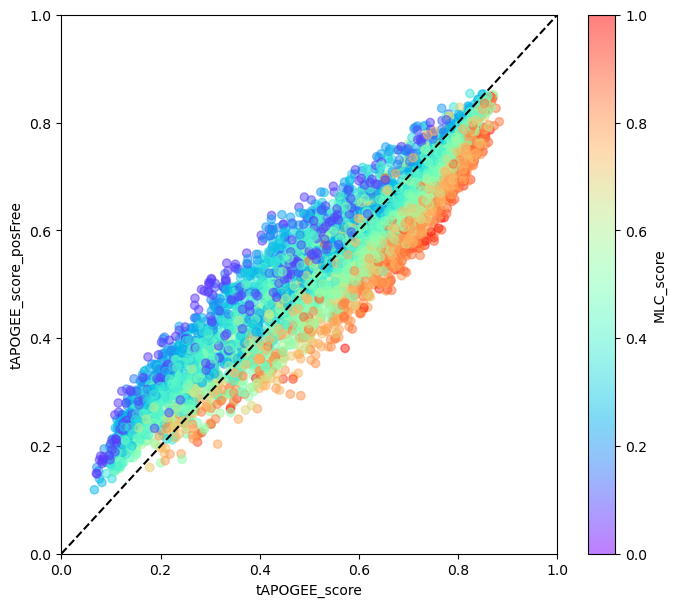

In [22]:
plt.figure(figsize=(8,7))
plt.scatter(
    mithril_predictions.tAPOGEE_score.values,
    mithril_predictions.tAPOGEE_score_posFree,
    alpha=.5, c=mithril_features.MLC_score,
    cmap="rainbow", vmin=0, vmax=1
)
plt.xlabel("tAPOGEE_score")
plt.ylabel("tAPOGEE_score_posFree")
plt.colorbar(label="MLC_score")
plt.plot([0,1],[0,1],"k--")
plt.xlim(0,1)
plt.ylim(0,1)
plt.show()

In [23]:
mithril_df = pd.read_csv(
    "../data/mithril_V03.txt",
    sep="\t", low_memory=False, index_col="Mithril_id", na_values="."
).join(
    (~pd.read_csv("../data/PTM_and_domains.txt", sep="\t", index_col=0).modification.isna())\
        .groupby(axis=0, level=0).any()
)
mithril_df = mithril_df.loc[mithril_df["class"]=="tRNA"]
mithril_df = mithril_df.loc[:,~(mithril_df.isna().all())]
mithril_df["aa"] =\
    mithril_df["extended.annotation"].str.split("-").str[-1].str.split(" ").str[0].str.strip()\
    + mithril_df["extended.annotation"].str.split(")", expand=True)[1].str.strip()

# following step is made in order to replicate the mtdb nomenclature:
# - invert Leu1 with Leu2
# - invert Ser1 with Ser2
mithril_df["aa"] = mithril_df.aa.str.replace("2","0").str.replace("1","2").str.replace("0","1")
mithril_df["gene.position"] = mithril_df["gene.position"].astype(int)

mithril_df.drop(['MITHRIL.17488', 'MITHRIL.17489', 'MITHRIL.17490'], axis=0, inplace=True)

mithril_df = mithril_df.join(mithril_features[mithril_features.columns.difference(mithril_df.columns)], how="outer")
mithril_df = mithril_df.join(mithril_predictions, how="right")

suzuki = pd.read_csv("../data/aligned_position_suzuki.csv", sep="\t", index_col="aa").T
for aa in mithril_df.aa.unique():
    suzuki.loc[~suzuki[aa].isna(), aa] = np.arange((~suzuki[aa].isna()).sum())+1
del aa
suzuki = suzuki.T
suzuki.columns.name="suzuki_pos"
suzuki = suzuki.stack().rename("gene.position").reset_index().set_index(["aa", "gene.position"])

mithril_df = mithril_df.merge(
    suzuki, on=["aa", "gene.position"],

)

mithril_df

,Start,Ref,Alt,class,Gene_symbol,extended.annotation,gene.position,gene.start,gene.end,gene.strand,...,ss_distorsion,stem,unpaired_frequency,tAPOGEE_score,tAPOGEE_oob_score,tAPOGEE_posterior,category,tAPOGEE_quantile,tAPOGEE_score_posFree,suzuki_pos
0,577,G,A,tRNA,MT-TF,TRNF; mitochondrially encoded tRNA-Phe (UUU/C),1,577,647,+,...,0.028169,1,0.011603,0.780641,0.780641,0.994751,pathogenic,0.90,0.815794,1
1,577,G,C,tRNA,MT-TF,TRNF; mitochondrially encoded tRNA-Phe (UUU/C),1,577,647,+,...,0.028169,1,0.011603,0.703568,0.703568,0.951709,likely pathogenic,0.77,0.743241,1
2,577,G,T,tRNA,MT-TF,TRNF; mitochondrially encoded tRNA-Phe (UUU/C),1,577,647,+,...,0.028169,1,0.011603,0.767472,0.767472,0.991911,pathogenic,0.88,0.803586,1
3,578,T,A,tRNA,MT-TF,TRNF; mitochondrially encoded tRNA-Phe (UUU/C),2,577,647,+,...,0.028169,1,0.014503,0.520965,0.520965,0.320783,VUS,0.46,0.594731,2
4,578,T,C,tRNA,MT-TF,TRNF; mitochondrially encoded tRNA-Phe (UUU/C),2,577,647,+,...,0.028169,1,0.014503,0.632326,0.632326,0.791225,VUS,0.64,0.714305,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4516,16022,T,C,tRNA,MT-TP,TRNP; mitochondrially encoded tRNA-Pro (CCN),2,15956,16023,-,...,0.000000,1,0.009386,0.665709,0.665709,0.887440,VUS,0.70,0.552938,2
4517,16022,T,G,tRNA,MT-TP,TRNP; mitochondrially encoded tRNA-Pro (CCN),2,15956,16023,-,...,0.029412,1,0.009386,0.773280,0.773280,0.993295,pathogenic,0.88,0.708746,2
4518,16023,G,A,tRNA,MT-TP,TRNP; mitochondrially encoded tRNA-Pro (CCN),1,15956,16023,-,...,0.000000,1,0.003610,0.841406,0.834604,0.999351,pathogenic,0.97,0.761488,1
4519,16023,G,C,tRNA,MT-TP,TRNP; mitochondrially encoded tRNA-Pro (CCN),1,15956,16023,-,...,0.029412,1,0.003610,0.789017,0.789017,0.996068,pathogenic,0.91,0.693084,1


In [24]:
human_MSA_score = mithril_df.groupby(["aa", "Human_MSA_position"]).tAPOGEE_oob_score.mean().unstack()
human_MSA_score

Human_MSA_position,0,1,2,3,4,5,6,7,8,9,...,68,69,70,71,72,73,74,75,76,77
aa,,,,,,,,,,,,,,,,,,,,,
Ala,0.404054,0.595210,0.759407,0.761453,0.387691,0.512200,0.705565,0.726910,0.710661,0.692400,...,0.703619,0.617119,0.594752,0.606441,0.341140,0.580572,0.649119,0.618066,0.537836,0.438991
Arg,0.516581,0.790878,0.718493,0.509876,0.396295,0.256582,0.356301,0.720188,0.665422,0.825891,...,0.686158,0.475953,0.403194,0.271737,0.431689,0.397949,0.454296,0.673096,0.486171,0.242882
Asn,0.777845,0.671247,0.834169,0.753810,0.484267,0.443692,0.614004,0.789649,0.665264,0.693537,...,0.562983,0.359017,0.299690,0.328440,0.404514,0.721993,0.821192,0.824053,0.770575,0.698076
Asp,0.327332,0.483922,0.737812,0.420582,0.566736,0.391927,0.580238,0.705311,0.637972,0.766430,...,0.247427,0.641468,0.384436,0.599980,0.394220,0.323740,0.619724,0.680173,0.475654,0.207772
Cys,0.498824,0.779419,0.576152,0.208433,0.527848,0.379053,0.644624,0.361134,0.475351,0.719760,...,0.767347,0.760040,0.751087,0.771855,0.813613,0.722475,0.812913,0.794128,0.679755,0.528301
Gln,0.614065,0.650696,0.802312,0.583023,0.504172,0.230945,0.260777,0.396689,0.457396,0.801648,...,0.396484,0.462428,0.256658,0.311800,0.603147,0.496038,0.702659,0.767080,0.663044,0.635505
Glu,0.614119,0.638469,0.730681,0.481088,0.559646,0.441909,0.603519,0.681680,0.685619,0.820351,...,0.228199,0.598596,0.447603,0.438708,0.400444,0.674443,0.673008,0.509034,0.300111,0.214583
Gly,0.468904,0.428115,0.452582,0.454133,0.517839,0.489074,0.513574,0.514182,0.652829,0.724831,...,0.380341,0.410421,0.485636,0.468916,0.486081,0.722902,0.535105,0.635112,0.577034,0.573834
His,0.730668,0.675262,0.474371,0.270499,0.352366,0.419550,0.428114,0.527224,0.576969,0.720464,...,0.485850,0.555656,0.502599,0.301723,0.423561,0.418253,0.502069,0.590308,0.736885,0.556637


In [25]:
from natsort import natsorted
human_suzuki_score = mithril_df.groupby(["aa", "suzuki_pos"]).tAPOGEE_oob_score.mean().unstack()
human_suzuki_score = human_suzuki_score[natsorted(human_suzuki_score.columns)]
human_suzuki_score

suzuki_pos,1,2,3,4,5,6,7,8,9,10,...,64,65,66,67,68,69,70,71,72,73
aa,,,,,,,,,,,,,,,,,,,,,
Ala,0.404054,0.595210,0.759407,0.761453,0.387691,0.512200,0.705565,0.726910,0.710661,0.692400,...,0.703619,0.617119,0.594752,0.606441,0.341140,0.580572,0.649119,0.618066,0.537836,0.438991
Arg,0.516581,0.790878,0.718493,0.509876,0.396295,0.256582,0.356301,0.720188,0.665422,0.825891,...,0.686158,0.475953,0.403194,0.271737,0.431689,0.397949,0.454296,0.673096,0.486171,0.242882
Asn,0.777845,0.671247,0.834169,0.753810,0.484267,0.443692,0.614004,0.789649,0.665264,0.693537,...,0.562983,0.359017,0.299690,0.328440,0.404514,0.721993,0.821192,0.824053,0.770575,0.698076
Asp,0.327332,0.483922,0.737812,0.420582,0.566736,0.391927,0.580238,0.705311,0.637972,0.766430,...,0.247427,0.641468,0.384436,0.599980,0.394220,0.323740,0.619724,0.680173,0.475654,0.207772
Cys,0.498824,0.779419,0.576152,0.208433,0.527848,0.379053,0.644624,0.361134,0.475351,0.719760,...,0.767347,0.760040,0.751087,0.771855,0.813613,0.722475,0.812913,0.794128,0.679755,0.528301
Gln,0.614065,0.650696,0.802312,0.583023,0.504172,0.230945,0.260777,0.396689,0.457396,0.801648,...,0.396484,0.462428,0.256658,0.311800,0.603147,0.496038,0.702659,0.767080,0.663044,0.635505
Glu,0.614119,0.638469,0.730681,0.481088,0.559646,0.441909,0.603519,0.681680,0.685619,0.820351,...,0.228199,0.598596,0.447603,0.438708,0.400444,0.674443,0.673008,0.509034,0.300111,0.214583
Gly,0.468904,0.428115,0.452582,0.454133,0.517839,0.489074,0.513574,0.514182,0.652829,0.724831,...,0.380341,0.410421,0.485636,0.468916,0.486081,0.722902,0.535105,0.635112,0.577034,0.573834
His,0.730668,0.675262,0.474371,0.270499,0.352366,0.419550,0.428114,0.527224,0.576969,0.720464,...,0.485850,0.555656,0.502599,0.301723,0.423561,0.418253,0.502069,0.590308,0.736885,0.556637


In [26]:
~human_suzuki_score.columns.str.match(".+_")

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [27]:
aa2gene = mithril_df.groupby("aa").Gene_symbol.first()
aa2gene

aa
Ala      MT-TA
Arg      MT-TR
Asn      MT-TN
Asp      MT-TD
Cys      MT-TC
Gln      MT-TQ
Glu      MT-TE
Gly      MT-TG
His      MT-TH
Ile      MT-TI
Leu1    MT-TL2
Leu2    MT-TL1
Lys      MT-TK
Met      MT-TM
Phe      MT-TF
Pro      MT-TP
Ser1    MT-TS2
Ser2    MT-TS1
Thr      MT-TT
Trp      MT-TW
Tyr      MT-TY
Val      MT-TV
Name: Gene_symbol, dtype: object

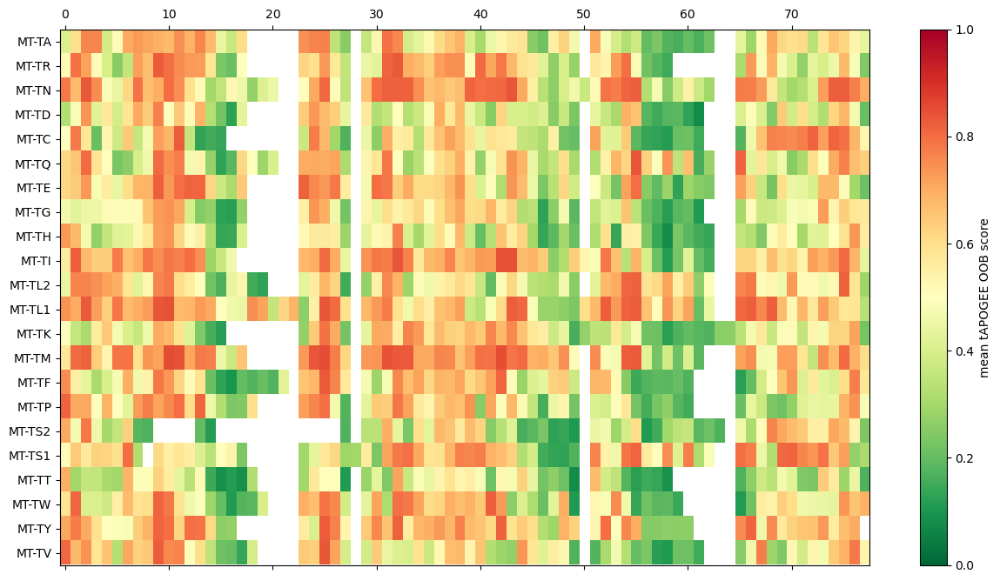

In [28]:
plt.figure(figsize=(15,8))
plt.matshow(human_MSA_score, cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE OOB score")
plt.yticks(range(human_MSA_score.shape[0]), aa2gene.loc[human_MSA_score.index])
plt.show()

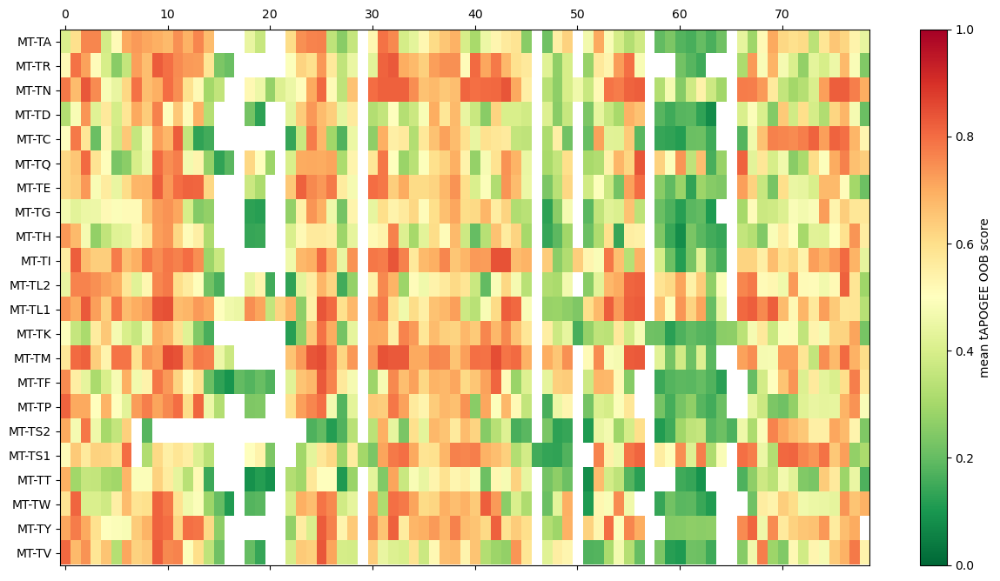

In [29]:
plt.figure(figsize=(15,8))
plt.matshow(human_suzuki_score, cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE OOB score")
plt.yticks(range(human_suzuki_score.shape[0]), aa2gene.loc[human_suzuki_score.index])
plt.show()

In [30]:
PATH_TO_TRNA_STRUCTURES = "../data/tRNA_Alignments_structure/"
wt_ss = []
for file_name in os.listdir(PATH_TO_TRNA_STRUCTURES):
    if re.match(r"^.*\.aln$", file_name):
        with open(PATH_TO_TRNA_STRUCTURES+file_name, "r") as file_pointer:
            while True:
                line = file_pointer.readline()
                if not line:
                    break
                if re.match("[^_]+_Homo_sapiens_9606_", line):
                    wt_ss.append(line.strip().split("\t"))
                    break
wt_ss = pd.DataFrame(wt_ss, columns=["aa", "aligned_ss"]).set_index("aa")
wt_ss["ss"] = wt_ss.aligned_ss.str.replace("-", "")
wt_ss.index = wt_ss.index.str.split("_").str[-2]
wt_ss

,aligned_ss,ss
aa,,
Thr,(((((((..-((((......--------)))).-((.((..........,(((((((..((((......)))).((.((.......)).))....(...
Pro,-(((((((..-((((......------)))).-(((((.......)...,(((((((..((((......)))).(((((.......)))))....(...
Cys,(((((((..-((((...--------------)))).-(((((.......,(((((((..((((...)))).(((((.......)))))....((((...
Phe,(((((((-..-((((.........----)))).-(.(((..........,(((((((..((((.........)))).(.(((.......))).).....
Val,(((((((..-((((......----)))).-((.((.......)).)...,(((((((..((((......)))).((.((.......)).))........
Ser2,(((((((.--((((.....-------)))).(--(((((..........,(((((((.((((.....)))).((((((.......))))))...((...
Tyr,---(((((((..(((.....-------------.))).-(((((.....,(((((((..(((......))).(((((.......)))))....(((...
Glu,(((((((..-((((.....--------))))((((((.......))...,(((((((..((((.....))))((((((.......))))))...((...
Ala,(((((((..((((.....--------))))((((((.......)))...,(((((((..((((.....))))((((((.......))))))...((...


In [31]:
PATH_TO_TRNA_SEQUENCES = "../data/tRNA_Alignments/"
wt_seq = []
for file_name in os.listdir(PATH_TO_TRNA_SEQUENCES):
    if re.match(r"^.*\.aln$", file_name):
        with open(PATH_TO_TRNA_SEQUENCES+file_name, "r") as file_pointer:
            while True:
                line = file_pointer.readline()
                if not line:
                    break
                if re.match("[^_]+_Homo_sapie_9606_", line):
                    wt_seq.append(line.strip().split("\t"))
                    break
wt_seq = pd.DataFrame(wt_seq, columns=["aa", "aligned_seq"]).set_index("aa")
wt_seq["seq"] = wt_seq.aligned_seq.str.replace("-", "")
wt_seq.index = wt_seq.index.str.split("_").str[-2]
wt_seq

,aligned_seq,seq
aa,,
Thr,GTCCTTGTA-GTATAAACTA--------ATACA-CCAGTCTTGTAA...,GTCCTTGTAGTATAAACTAATACACCAGTCTTGTAAACCGGAGATG...
Pro,-CAGAGAATA-GTTTAAATTA------GAATC-TTAGCTTTGGGTG...,CAGAGAATAGTTTAAATTAGAATCTTAGCTTTGGGTGCTAATGGTG...
Cys,AGCTCCGAG-GTGATTT--------------TCATA-TTGAATTGC...,AGCTCCGAGGTGATTTTCATATTGAATTGCAAATTCGAAGAAGCAG...
Phe,GTTTATG-TA-GCTTACCTCCTCA----AAGCA-ATACACTGAAAA...,GTTTATGTAGCTTACCTCCTCAAAGCAATACACTGAAAATGTTTAG...
Val,CAGAGTGTA-GCTTAACACA----AAGCA-CCCAACTTACACTTAG...,CAGAGTGTAGCTTAACACAAAGCACCCAACTTACACTTAGGAGATT...
Ser2,GAAAAAGT--CATGGAGGC-------CATGGG--GTTGGCTTGAAA...,GAAAAAGTCATGGAGGCCATGGGGTTGGCTTGAAACCAGCTTTGGG...
Tyr,---GGTAAAATGGCTGAGTG-------------AAGCA-TTGGACT...,GGTAAAATGGCTGAGTGAAGCATTGGACTGTAAATCTAAAGACAGG...
Glu,GTTCTTGTA-GTTGAAATA--------CAACGATGGTTTTTCATAT...,GTTCTTGTAGTTGAAATACAACGATGGTTTTTCATATCATTGGTCG...
Ala,AAGGGCTTAGCTTAATTA--------AAGTGGCTGATTTGCGTTCA...,AAGGGCTTAGCTTAATTAAAGTGGCTGATTTGCGTTCAGTTGATGC...


In [32]:
wt_seq_ss = wt_ss.join(wt_seq)
wt_seq_ss

,aligned_ss,ss,aligned_seq,seq
aa,,,,
Thr,(((((((..-((((......--------)))).-((.((..........,(((((((..((((......)))).((.((.......)).))....(...,GTCCTTGTA-GTATAAACTA--------ATACA-CCAGTCTTGTAA...,GTCCTTGTAGTATAAACTAATACACCAGTCTTGTAAACCGGAGATG...
Pro,-(((((((..-((((......------)))).-(((((.......)...,(((((((..((((......)))).(((((.......)))))....(...,-CAGAGAATA-GTTTAAATTA------GAATC-TTAGCTTTGGGTG...,CAGAGAATAGTTTAAATTAGAATCTTAGCTTTGGGTGCTAATGGTG...
Cys,(((((((..-((((...--------------)))).-(((((.......,(((((((..((((...)))).(((((.......)))))....((((...,AGCTCCGAG-GTGATTT--------------TCATA-TTGAATTGC...,AGCTCCGAGGTGATTTTCATATTGAATTGCAAATTCGAAGAAGCAG...
Phe,(((((((-..-((((.........----)))).-(.(((..........,(((((((..((((.........)))).(.(((.......))).).....,GTTTATG-TA-GCTTACCTCCTCA----AAGCA-ATACACTGAAAA...,GTTTATGTAGCTTACCTCCTCAAAGCAATACACTGAAAATGTTTAG...
Val,(((((((..-((((......----)))).-((.((.......)).)...,(((((((..((((......)))).((.((.......)).))........,CAGAGTGTA-GCTTAACACA----AAGCA-CCCAACTTACACTTAG...,CAGAGTGTAGCTTAACACAAAGCACCCAACTTACACTTAGGAGATT...
Ser2,(((((((.--((((.....-------)))).(--(((((..........,(((((((.((((.....)))).((((((.......))))))...((...,GAAAAAGT--CATGGAGGC-------CATGGG--GTTGGCTTGAAA...,GAAAAAGTCATGGAGGCCATGGGGTTGGCTTGAAACCAGCTTTGGG...
Tyr,---(((((((..(((.....-------------.))).-(((((.....,(((((((..(((......))).(((((.......)))))....(((...,---GGTAAAATGGCTGAGTG-------------AAGCA-TTGGACT...,GGTAAAATGGCTGAGTGAAGCATTGGACTGTAAATCTAAAGACAGG...
Glu,(((((((..-((((.....--------))))((((((.......))...,(((((((..((((.....))))((((((.......))))))...((...,GTTCTTGTA-GTTGAAATA--------CAACGATGGTTTTTCATAT...,GTTCTTGTAGTTGAAATACAACGATGGTTTTTCATATCATTGGTCG...
Ala,(((((((..((((.....--------))))((((((.......)))...,(((((((..((((.....))))((((((.......))))))...((...,AAGGGCTTAGCTTAATTA--------AAGTGGCTGATTTGCGTTCA...,AAGGGCTTAGCTTAATTAAAGTGGCTGATTTGCGTTCAGTTGATGC...


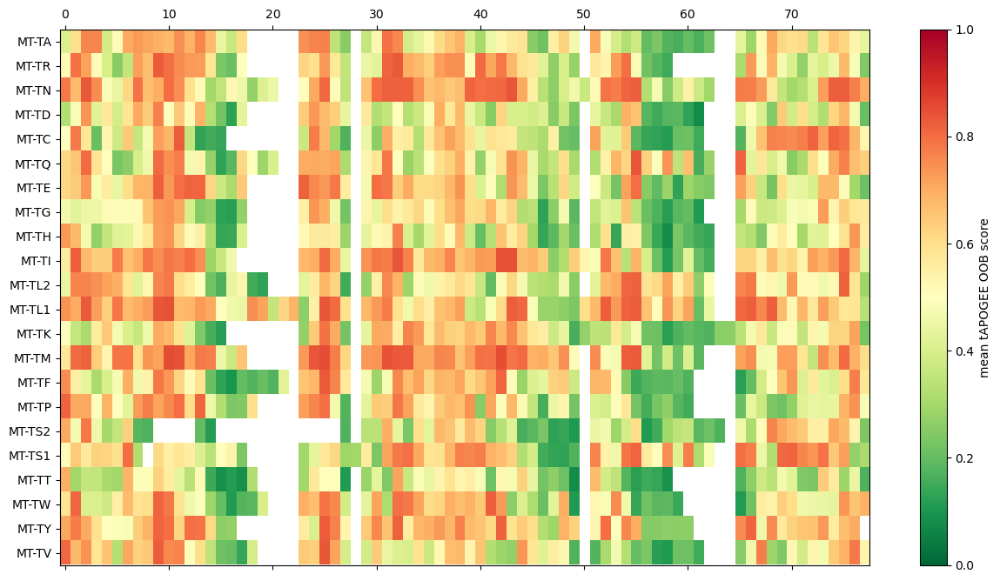

In [33]:
plt.figure(figsize=(15,8))
plt.matshow(human_MSA_score, cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE OOB score")
# plt.xticks(range(human_MSA_score.shape[1]), human_MSA_score.columns, rotation=90)
plt.yticks(range(human_MSA_score.shape[0]), aa2gene[human_MSA_score.index])
plt.show()

In [34]:
human_MSA_ss = human_MSA_score.loc[wt_seq_ss.index].copy().astype(str).values
# human_MSA_ss = human_MSA_score.copy().astype(str).values
human_MSA_ss[human_MSA_ss!="nan"] = wt_seq_ss.ss.apply(list).explode().values
human_MSA_ss[human_MSA_ss=="nan"] = "-"
human_MSA_ss = pd.DataFrame(human_MSA_ss, index=wt_seq_ss.index).apply(lambda s: "".join(s), axis=1)
human_MSA_ss

aa
Thr     (((((((..((((......----)))).-((.((.......)).))...
Pro     (((((((..((((......----)))).-(((((.......)))))...
Cys     (((((((..((((...-------)))).-(((((.......)))))...
Phe     (((((((..((((.........-)))).-(.(((.......))).)...
Val     (((((((..((((......----)))).-((.((.......)).))...
Ser2    (((((((.-((((.....-----)))).((((((.......)))))...
Tyr     (((((((..(((.....------.))).-(((((.......)))))...
Glu     (((((((..((((.....-----))))(-(((((.......)))))...
Ala     (((((((..((((.....-----))))(-(((((.......)))))...
Asp     (((((((..((((.....-----)))).-(((((.......)))))...
Asn     (((((((..(((.........--.)))(-(((((.......)))))...
Ile     (((((((..(((.....------.))).-(((((.......)))))...
Ser1    (((((((..----..------------(-(.((.........)).)...
Arg     (((((.(..((((.....-----)))).-(((((.......)))))...
Met     ((((.((..((((.....-----)))).-(((((.......)))))...
Gly     (((((((..((((.....-----)))).-(((((.......)))))...
His     (((((((..((((.....-----)))).-(((((.......)))))...
Leu2    (((

In [35]:
human_suzuki_ss = human_suzuki_score.loc[wt_seq_ss.index].copy().astype(str).values
# human_suzuki_ss = human_suzuki_score.copy().astype(str).values
human_suzuki_ss[human_suzuki_ss!="nan"] = wt_seq_ss.ss.apply(list).explode().values
human_suzuki_ss[human_suzuki_ss=="nan"] = "-"
human_suzuki_ss = pd.DataFrame(human_suzuki_ss, index=wt_seq_ss.index).apply(lambda s: "".join(s), axis=1)
human_suzuki_ss

aa
Thr     (((((((..((((..---...-.)))).(-(.((.......)).))...
Pro     (((((((..((((...--..--.)))).(-((((.......)))))...
Cys     (((((((..((((..-------.)))).(-((((.......)))))...
Phe     (((((((..((((........-.)))).(-.(((.......))).)...
Val     (((((((..((((...--..--.)))).(-(.((.......)).))...
Ser2    (((((((-.((((..---...--)))).((((((.......)))))...
Tyr     (((((((..(((....------..))).(-((((.......)))))...
Glu     (((((((..((((..---..--.))))((-((((.......)))))...
Ala     (((((((..((((..---..--.))))((-((((.......)))))...
Asp     (((((((..((((..---..--.)))).(-((((.......)))))...
Asn     (((((((..(((....--......)))((-((((.......)))))...
Ile     (((((((..(((....------..))).(-((((.......)))))...
Ser1    (((((((-.---------------...((-.((.........)).)...
Arg     (((((.(..((((....-----.)))).(-((((.......)))))...
Met     ((((.((..((((....-----.)))).(-((((.......)))))...
Gly     (((((((..((((..---..--.)))).(-((((.......)))))...
His     (((((((..((((..---..--.)))).(-((((.......)))))...
Leu2    (((

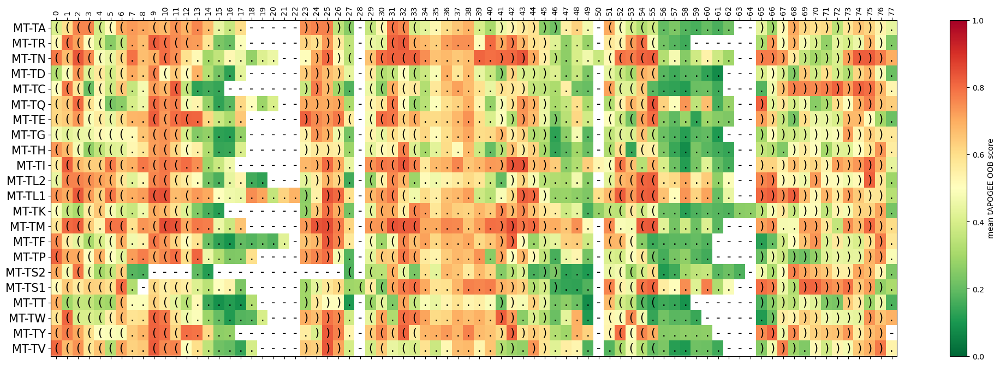

In [36]:
plt.figure(figsize=(25,8))
plt.matshow(human_MSA_score, cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE OOB score")
for i, aa in enumerate(human_MSA_score.index):
    for j, symbol in enumerate(human_MSA_ss[aa]):
        plt.text(j, i, symbol, ha='center', va='center', fontsize=15, color="black")
plt.xticks(range(human_MSA_score.shape[1]), human_MSA_score.columns, rotation=90)
plt.yticks(range(human_MSA_score.shape[0]), aa2gene[human_MSA_score.index], fontsize=15)
plt.show()

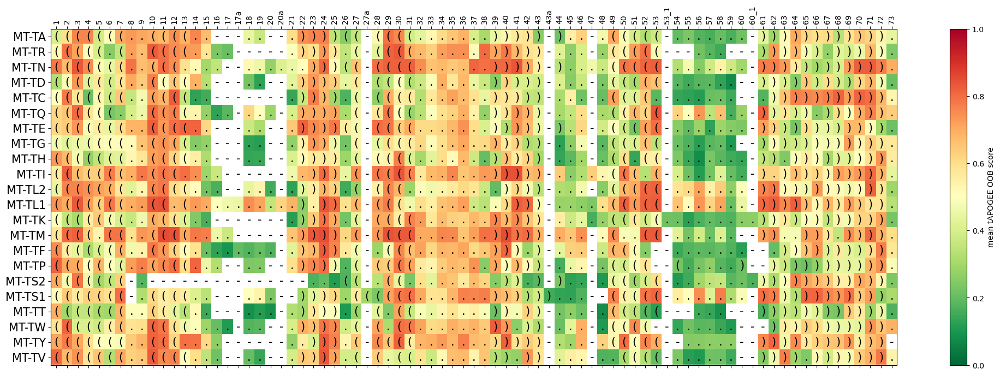

In [37]:
plt.figure(figsize=(25,8))
plt.matshow(human_suzuki_score, cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE OOB score")
for i, aa in enumerate(human_suzuki_score.index):
    for j, symbol in enumerate(human_suzuki_ss[aa]):
        plt.text(j, i, symbol, ha='center', va='center', fontsize=15, color="black")
plt.xticks(range(human_suzuki_score.shape[1]), human_suzuki_score.columns, rotation=90)
plt.yticks(range(human_suzuki_score.shape[0]), aa2gene[human_suzuki_score.index], fontsize=15)
plt.show()

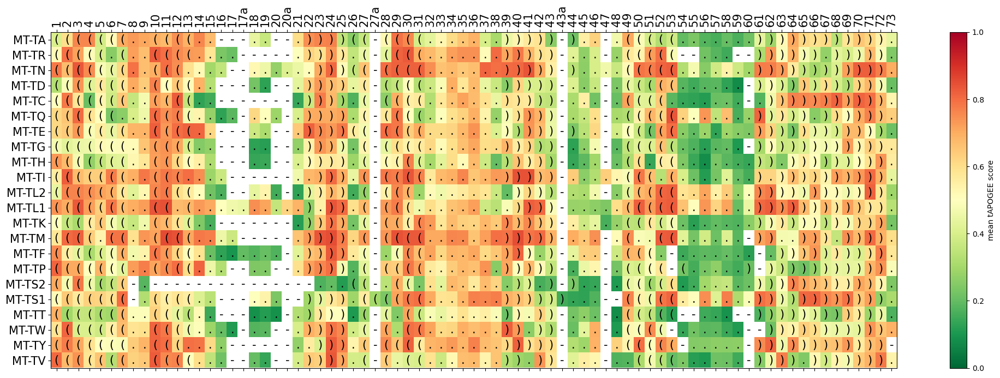

In [38]:

plt.figure(figsize=(25,8))
plt.matshow(human_suzuki_score.loc[:, ~human_suzuki_score.columns.str.match(".+_")], cmap="RdYlGn_r", vmin=0, vmax=1, fignum=0, aspect="auto",)
plt.colorbar(label="mean tAPOGEE score")
for i, aa in enumerate(human_suzuki_score.index):
    for j, symbol in enumerate("".join(np.array(list(human_suzuki_ss[aa]))[~human_suzuki_score.columns.str.match(".+_")])):
        # if symbol=="-":
        #     symbol = ""
        plt.text(j, i, symbol, ha='center', va='center', fontsize=15, color="black")
plt.xticks(
    range((~human_suzuki_score.columns.str.match(".+_")).sum()),
    human_suzuki_score.columns[~human_suzuki_score.columns.str.match(".+_")],
    rotation=90, fontsize=15
)
plt.yticks(range(human_suzuki_score.shape[0]), aa2gene[human_suzuki_score.index], fontsize=15)
plt.savefig("../../figures/svg/suzuki_average_score.svg", bbox_inches='tight')
plt.show()

In [39]:
def parse_dot_bracket(structure):
    """Parse dot-bracket notation and return a dict of base pairs."""
    stack = []
    pairs = {}
    for i, char in enumerate(structure):
        if char == '(':
            stack.append(i)
        elif char == ')':
            if stack:
                j = stack.pop()
                pairs[j] = i
                pairs[i] = j
    return pairs

def mean_ss_graph(series):
    node_names = human_suzuki_score.columns
    alignment_length = len(series.iloc[0])
    G = nx.Graph()

    # Initialize nodes with non-gap counts
    for i in range(alignment_length):
        non_gap_count = sum(s[i] != '-' for s in series.values)
        G.add_node(node_names[i], non_gap_count=non_gap_count)

    # # Add edges between consecutive positions
    # for i in range(alignment_length - 1):
    #     G.add_edge(node_names[i], node_names[i+1], weight=len(series))

    # Count base-pair occurrences across all sequences
    pair_weights = {}
    for structure in series:
        pairs = parse_dot_bracket(structure)
        seen = set()
        for i, j in pairs.items():
            i_name, j_name = node_names[i], node_names[j]
            if (j_name, i_name) not in seen:
                pair_weights[(i_name, j_name)] = pair_weights.get((i_name, j_name), 0) + 1
                seen.add((i_name, j_name))

    # Add base-pair edges with weights
    for (i, j), w in pair_weights.items():
        if G.has_edge(i, j):
            G[i][j]['weight'] += w  # combine with linear edge
        else:
            G.add_edge(i, j, weight=w)

    return G

G = mean_ss_graph(human_suzuki_ss)
G

In [40]:
# def plot_graph(G, figsize=(10, 10), scale_node=100, scale_edge=1, pos=None):

#     def filtered_graph(G, threshold):
#         subG = G.copy()
#         subG.remove_edges_from([(u, v) for u, v, d in subG.edges(data=True) if d['weight'] < threshold])
#         return subG

#     if pos is None:
#         pos = nx.kamada_kawai_layout(filtered_graph(G, 15), weight='weight')  # You can try others like nx.kamada_kawai_layout
#     #print(pos)

#     # Get node sizes from 'non_gap_count' attribute
#     node_sizes = [G.nodes[n]['non_gap_count'] * scale_node for n in G.nodes]

#     # Get edge widths from 'weight' attribute
#     edge_weights = [G[u][v]['weight'] * scale_edge for u, v in G.edges]

#     # Draw graph components
#     plt.figure(figsize=figsize)
#     nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', edgecolors='black')
#     nx.draw_networkx_edges(G, pos, width=edge_weights, alpha=0.7)
#     nx.draw_networkx_labels(G, pos, font_size=10)

#     plt.axis('off')
#     plt.tight_layout()
    

# plt.figure(figsize=(15,15))
# plot_graph(G, scale_node=15, scale_edge=.1)
# plt.show()

In [41]:
def parse_ps(file_path):
    with open(file_path, "r") as file_pointer:

        file_txt = file_pointer.read()

        raw_coord = file_txt.split("\n/coor [\n")[-1].split("\n] def\n")[0]
        coord_df = pd.DataFrame([line.replace("[", "").replace("]", "").split(" ") for line in raw_coord.split("\n")]).astype(float)

        raw_pairs = file_txt.split("\n/pairs [\n")[-1].split("\n] def\n")[0]
        pairs_df = pd.DataFrame([line.replace("[", "").replace("]", "").split(" ") for line in raw_pairs.split("\n")]).astype(int)

        seq = np.array(list(file_txt.split("\n/sequence { (\\\n")[-1].split("\\\n) } def\n")[0]))

    return seq, coord_df.values, pairs_df.values-1

parse_ps("wt_ss_figures/_suzuki_ss.eps")

(array(['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',
        'O'], dtype='<U1'),
 array([[ 1.10652634e+02,  2.26689011e+02],
        [ 1.10063736e+02,  2.11700577e+02],
        [ 1.09474838e+02,  1.96712143e+02],
        [ 1.08885941e+02,  1.81723709e+02],
        [ 1.08297050e+02,  1.66735275e+02],
        [ 1.07708153e+02,  1.51746841e+02],
        [ 1.07119255e+02,  1.36758408e+02],
        [ 9.01884308e+01,  1.34321487e+02],
        [ 7.69022369e+01,  1.24883392e+02],
        [ 6.97778931e+01,  1.11129372e+02],
        [ 5.48818626e+01,  1.12892433e+02],
        [ 3.99858360e+01,  1.14655495e+02],
      

In [42]:
suzuki_topology = parse_ps("wt_ss_figures/_suzuki_ss.eps")[1]
suzuki_topology

array([[ 1.10652634e+02,  2.26689011e+02],
       [ 1.10063736e+02,  2.11700577e+02],
       [ 1.09474838e+02,  1.96712143e+02],
       [ 1.08885941e+02,  1.81723709e+02],
       [ 1.08297050e+02,  1.66735275e+02],
       [ 1.07708153e+02,  1.51746841e+02],
       [ 1.07119255e+02,  1.36758408e+02],
       [ 9.01884308e+01,  1.34321487e+02],
       [ 7.69022369e+01,  1.24883392e+02],
       [ 6.97778931e+01,  1.11129372e+02],
       [ 5.48818626e+01,  1.12892433e+02],
       [ 3.99858360e+01,  1.14655495e+02],
       [ 2.50898113e+01,  1.16418556e+02],
       [ 1.91007862e+01,  1.30561646e+02],
       [ 6.83292961e+00,  1.39802612e+02],
       [-8.41376877e+00,  1.41655655e+02],
       [-2.25380230e+01,  1.35622330e+02],
       [-3.17404785e+01,  1.23325562e+02],
       [-3.35457230e+01,  1.08073128e+02],
       [-2.74681530e+01,  9.39678574e+01],
       [-1.51426058e+01,  8.48039932e+01],
       [ 1.15409340e-01,  8.30465622e+01],
       [ 1.42015629e+01,  8.91683197e+01],
       [ 2.

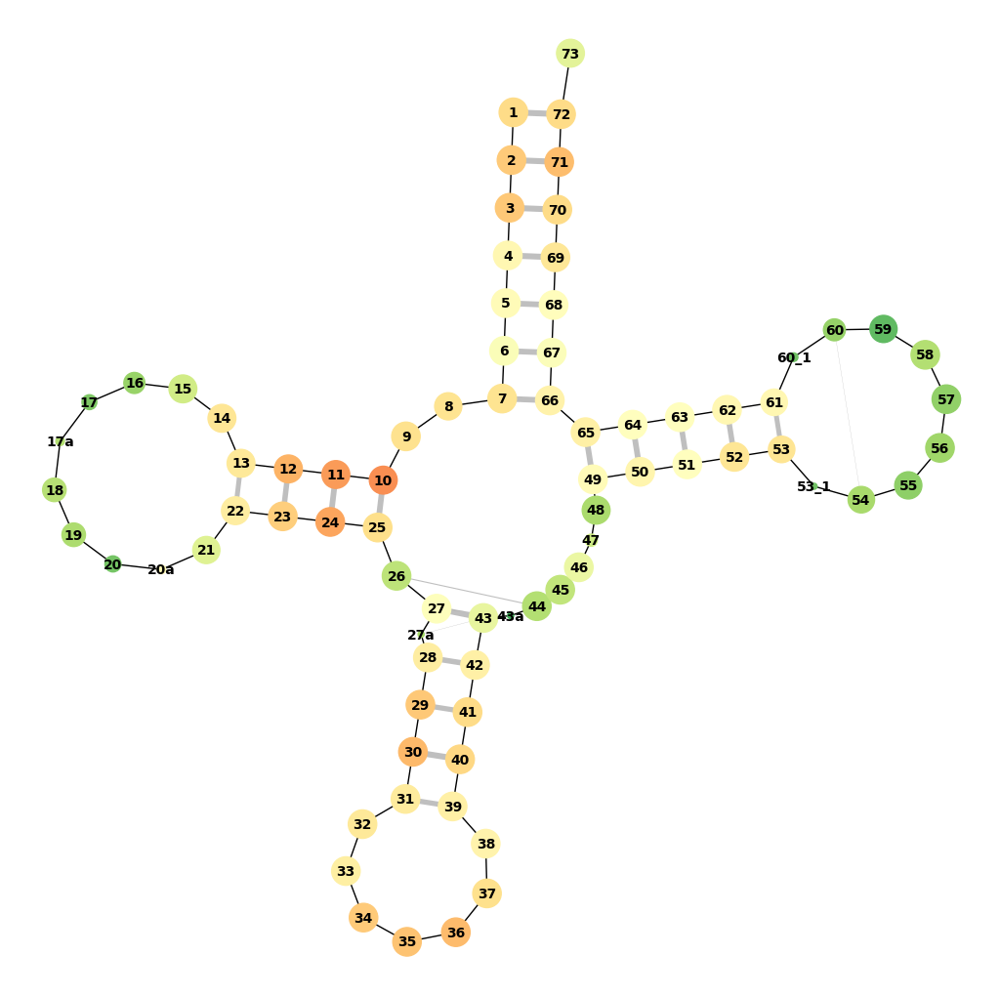

In [44]:
plt.figure(figsize=(13,13))


plt.plot(*suzuki_topology.T, c="k", alpha=1, linewidth=1, linestyle="-",zorder=1)
for i_name, j_name, attr in G.edges(data=True):
    i_pos = suzuki_topology[human_suzuki_score.columns==i_name][0]
    j_pos = suzuki_topology[human_suzuki_score.columns==j_name][0]
    weight = attr["weight"]
    plt.plot(
        [i_pos[0], j_pos[0]],
        [i_pos[1], j_pos[1]],
        linewidth=weight/5,
        c="grey", alpha=.5, linestyle="-",
        zorder=2
    )

plt.scatter(
    suzuki_topology[:, 0], suzuki_topology[:, 1], alpha=1.,
    c=human_suzuki_score.mean(), cmap="RdYlGn_r", vmin=0, vmax=1,
    s=(human_suzuki_ss.apply(list).apply(pd.Series)!="-").sum().values * 20,
    zorder=3
    
)

for base, coord in zip(human_suzuki_score.columns, suzuki_topology):
        plt.text(coord[0], coord[1], base, va="center", ha="center", fontweight="bold", zorder=4, fontsize=10)

# equal scale x and y axes
plt.gca().set_aspect("equal", adjustable="box")
#plt.colorbar(label="mean tAPOGEE score")
plt.axis("off")
plt.show()

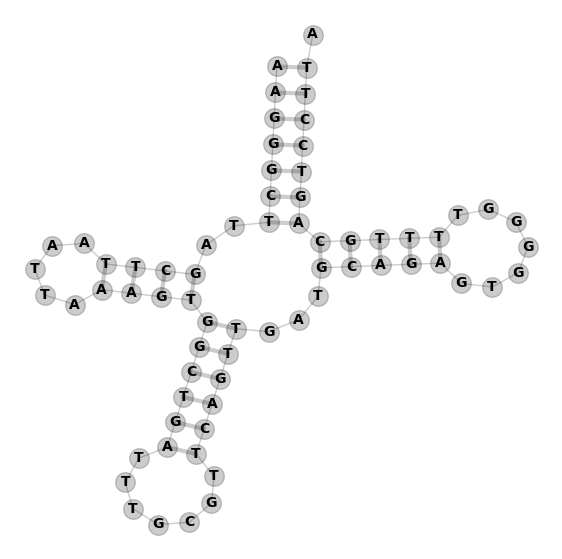

In [45]:
def plot_ps(file_path, backbone_args={}, nt_args={}, pairs_args={},
            text_args={}, highlight_nt=None, highlight_args={}):

    seq, points, links = parse_ps(file_path)
    
    plt.plot(*points.T, **backbone_args)
    plt.scatter(*points.T, **nt_args)
    plt.plot(
        points[links[:,], 0].T, points[links[:,], 1].T,
        **pairs_args
    )
    for nt, coord in zip(seq, points):
        plt.text(coord[0], coord[1], nt, va="center", ha="center", **text_args)
    
    if not highlight_nt is None:
         plt.scatter(*points.T[:,highlight_nt], **highlight_args)

plt.figure(figsize=(7,7))
plot_ps(
    "wt_ss_figures/Ala_ss.ps",
    backbone_args={
        "color":"k", "linewidth":1, "alpha":.2
    },
    nt_args={
        "s":200, "c":"k", "alpha":.2, "edgecolors":(0,0,0),
    },
    pairs_args={
        "color":"k", "linewidth":3, "alpha":.2
    },
    text_args={
        "fontweight":"bold"
    },
    # highlight_nt=[0, 1],
    # highlight_args={
    #     "color":(0,0,0,0), "edgecolors":(0,0,0,1), "linewidth":3, "s":500
    # }
)
plt.axis("off")
plt.show()

In [ ]:
mithril_features.columns

Index(['PhastCons_100V', 'PhyloP_100V', 'MLC_score', 'ss_distorsion', 'ddG',
       'ref_frequency', 'alt_frequency', 'coverage', 'entropy',
       'conservation_blocks', 'PWM_score', 'Human_MSA_position', 'bulge',
       'stem', 'hairpin', 'loop', 'unpaired_frequency', 'closest_modification',
       'closest_modification_2D', 'OEUF_score'],
      dtype='object')

In [47]:
wt_seq_ss["graph"] = wt_seq_ss.ss.apply(dot_bracket_to_graph)
wt_seq_ss

,aligned_ss,ss,aligned_seq,seq,graph
aa,,,,,
Thr,(((((((..-((((......--------)))).-((.((..........,(((((((..((((......)))).((.((.......)).))....(...,GTCCTTGTA-GTATAAACTA--------ATACA-CCAGTCTTGTAA...,GTCCTTGTAGTATAAACTAATACACCAGTCTTGTAAACCGGAGATG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Pro,-(((((((..-((((......------)))).-(((((.......)...,(((((((..((((......)))).(((((.......)))))....(...,-CAGAGAATA-GTTTAAATTA------GAATC-TTAGCTTTGGGTG...,CAGAGAATAGTTTAAATTAGAATCTTAGCTTTGGGTGCTAATGGTG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Cys,(((((((..-((((...--------------)))).-(((((.......,(((((((..((((...)))).(((((.......)))))....((((...,AGCTCCGAG-GTGATTT--------------TCATA-TTGAATTGC...,AGCTCCGAGGTGATTTTCATATTGAATTGCAAATTCGAAGAAGCAG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Phe,(((((((-..-((((.........----)))).-(.(((..........,(((((((..((((.........)))).(.(((.......))).).....,GTTTATG-TA-GCTTACCTCCTCA----AAGCA-ATACACTGAAAA...,GTTTATGTAGCTTACCTCCTCAAAGCAATACACTGAAAATGTTTAG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Val,(((((((..-((((......----)))).-((.((.......)).)...,(((((((..((((......)))).((.((.......)).))........,CAGAGTGTA-GCTTAACACA----AAGCA-CCCAACTTACACTTAG...,CAGAGTGTAGCTTAACACAAAGCACCCAACTTACACTTAGGAGATT...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Ser2,(((((((.--((((.....-------)))).(--(((((..........,(((((((.((((.....)))).((((((.......))))))...((...,GAAAAAGT--CATGGAGGC-------CATGGG--GTTGGCTTGAAA...,GAAAAAGTCATGGAGGCCATGGGGTTGGCTTGAAACCAGCTTTGGG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Tyr,---(((((((..(((.....-------------.))).-(((((.....,(((((((..(((......))).(((((.......)))))....(((...,---GGTAAAATGGCTGAGTG-------------AAGCA-TTGGACT...,GGTAAAATGGCTGAGTGAAGCATTGGACTGTAAATCTAAAGACAGG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Glu,(((((((..-((((.....--------))))((((((.......))...,(((((((..((((.....))))((((((.......))))))...((...,GTTCTTGTA-GTTGAAATA--------CAACGATGGTTTTTCATAT...,GTTCTTGTAGTTGAAATACAACGATGGTTTTTCATATCATTGGTCG...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
Ala,(((((((..((((.....--------))))((((((.......)))...,(((((((..((((.....))))((((((.......))))))...((...,AAGGGCTTAGCTTAATTA--------AAGTGGCTGATTTGCGTTCA...,AAGGGCTTAGCTTAATTAAAGTGGCTGATTTGCGTTCAGTTGATGC...,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


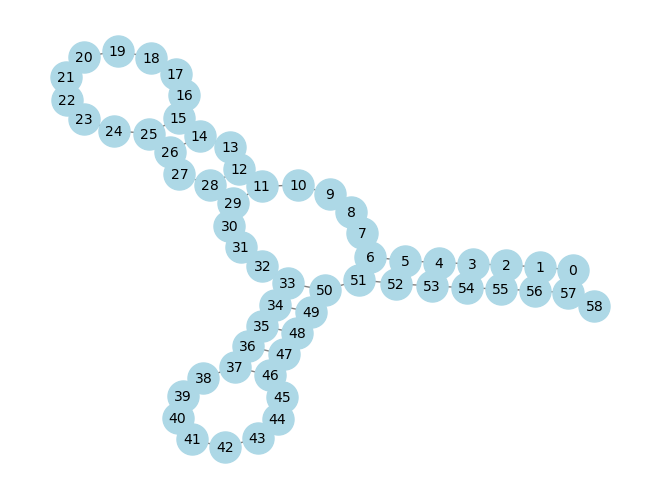

In [48]:
draw_rna_graph(wt_seq_ss.loc["Ser1", "graph"])

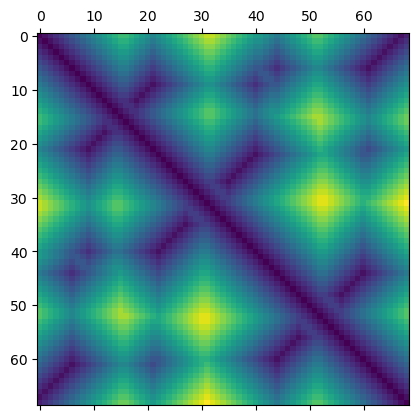

In [49]:
plt.matshow(
    nx.floyd_warshall_numpy(wt_seq_ss.loc["Ala", "graph"])
)

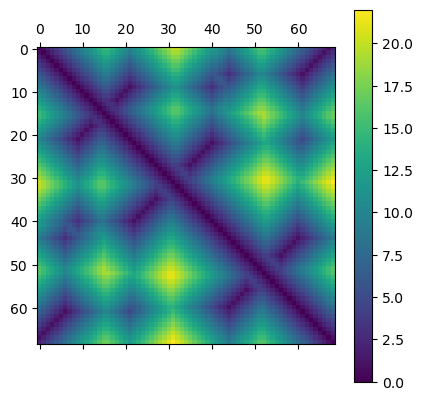

In [50]:
def graph_distance_matrix(graph):
    D = nx.floyd_warshall_numpy(graph)
    return D

plt.matshow(
    graph_distance_matrix(wt_seq_ss.loc["Ala", "graph"])
)
plt.colorbar()

Text(0, 0.5, 'similarity')

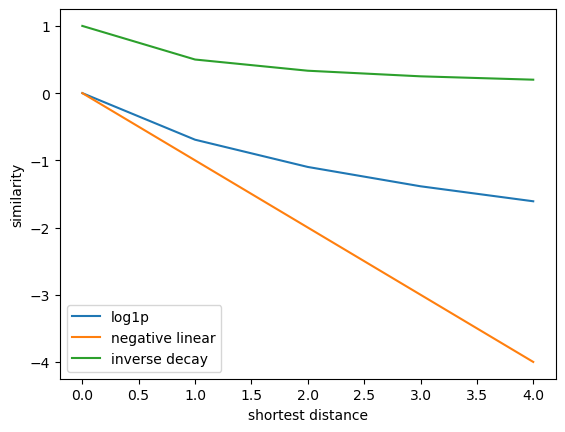

In [51]:
plt.plot(
    np.arange(5),
    -np.log1p(np.arange(5)),
    label="log1p"
)
plt.plot(
    np.arange(5),
    -np.arange(5),
    label="negative linear"
)
plt.plot(
    np.arange(5),
    1/(1+np.arange(5)),
    label="inverse decay"
)
plt.legend()
plt.xlabel("shortest distance")
plt.ylabel("similarity")

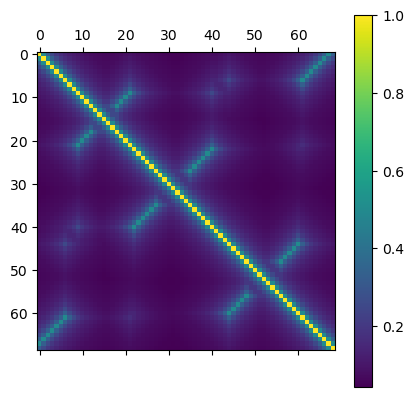

In [52]:
# def graph_similarity_matrix(graph):
#     D = graph_distance_matrix(graph)
#     # S = np.log2(1+1/D)
#     S = 1/D
#     S[np.isnan(S)] = 0.
#     return S

def graph_similarity_matrix(graph):
    D = graph_distance_matrix(graph)
    S = 1/(1+D)
    return S

plt.matshow(
    graph_similarity_matrix(wt_seq_ss.loc["Ala", "graph"])
)
plt.colorbar()

In [53]:
def lisa(y, W, row_normalize=False, return_pvalue=False, adjust_pvalues=False, n_permutations=1000):
    z = np.array((y-y.mean())/y.std())
    if row_normalize:
        W = W/W.sum(axis=1)[:,None]
    W = W/W.sum()
    l = z@W*z

    if return_pvalue:
        permutations = np.array([
            lisa(np.random.permutation(y), W, row_normalize=row_normalize, return_pvalue=False)
            for _ in range(n_permutations)
        ])
        p_values = np.c_[np.mean(permutations >= l, axis=0), np.mean(permutations <= l, axis=0)].min(axis=1)*2
        if adjust_pvalues:
            p_values = p_adjust_bh(p_values)
        return l, p_values
    return l

In [54]:
l, p = lisa(
    mithril_df.query("aa=='%s'"%"Ala").groupby("gene.position").tAPOGEE_score_posFree.mean().values,
    graph_similarity_matrix(wt_seq_ss.loc["Ala", "graph"]),
    row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
)

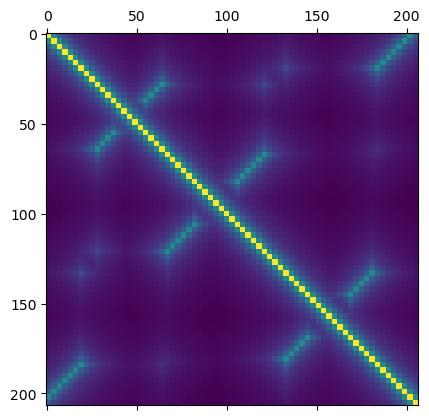

In [55]:
plt.matshow(graph_similarity_matrix(wt_seq_ss.loc["Ala", "graph"]).repeat(3, axis=0).repeat(3, axis=1))

In [56]:
l, p = lisa(
    mithril_df.query("aa=='%s'"%"Ala").groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
    graph_similarity_matrix(wt_seq_ss.loc["Ala", "graph"]).repeat(3, axis=0).repeat(3, axis=1),
    row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
)

/tmp/ipykernel_2606572/3342593021.py:2: RuntimeWarning: divide by zero encountered in log10
  l, -np.log10(p)


Text(0, 0.5, '-log10(p)')

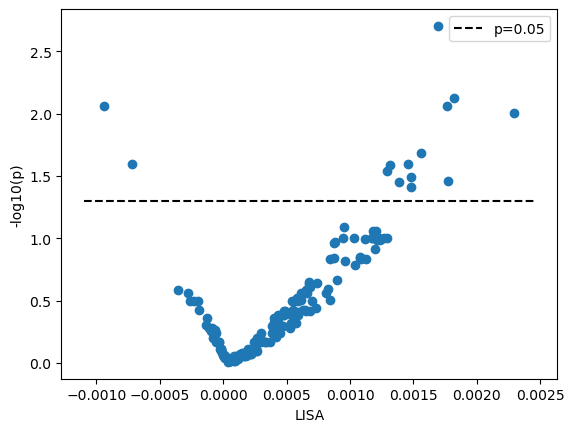

In [57]:
plt.scatter(
    l, -np.log10(p)
)
plt.hlines(-np.log10(.05), *plt.xlim(), linestyle="--", color="k", label="p=0.05")
plt.legend()
plt.xlabel("LISA")
plt.ylabel("-log10(p)")

In [ ]:
def moransI(y, W, row_normalize=False, return_pvalue=False, n_permutations=1000):
    z = np.array((y-y.mean())/y.std())
    if row_normalize:
        W = W/W.sum(axis=1)[:,None]
    W = W/W.sum()
    I = z@W@z
    if return_pvalue:
        permutations = np.array([
            moransI(np.random.permutation(y), W, row_normalize=row_normalize, return_pvalue=False)
            for _ in range(n_permutations)
        ])
        p_value = min(np.sum(permutations >= I), np.sum(permutations <= I)) * 2 / n_permutations
        return I, p_value
    else:
        return I

In [59]:
moransI(
    mithril_df.query("aa=='%s'"%"Ala").groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
    graph_similarity_matrix(wt_seq_ss.loc["Ala", "graph"]).repeat(3, axis=0).repeat(3, axis=1),
    row_normalize=True, return_pvalue=True, n_permutations=10_000
)

(np.float64(0.15213994792523156), np.float64(0.0))

In [60]:
mithril_df.query("aa=='%s'"%"Ala").groupby("gene.position").tAPOGEE_score_posFree.mean()

gene.position
1     0.438187
2     0.513653
3     0.702611
4     0.732085
5     0.431974
        ...   
65    0.613118
66    0.682944
67    0.654897
68    0.576791
69    0.529170
Name: tAPOGEE_score_posFree, Length: 69, dtype: float64

In [61]:
graph_distance_matrix(wt_seq_ss.loc["Ala", "graph"])

array([[0., 1., 2., ..., 2., 1., 2.],
       [1., 0., 1., ..., 1., 2., 3.],
       [2., 1., 0., ..., 2., 3., 4.],
       ...,
       [2., 1., 2., ..., 0., 1., 2.],
       [1., 2., 3., ..., 1., 0., 1.],
       [2., 3., 4., ..., 2., 1., 0.]])

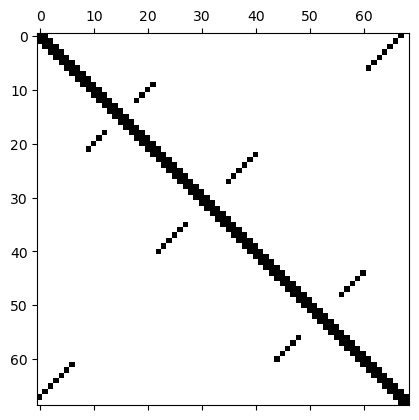

In [62]:
plt.matshow(graph_distance_matrix(wt_seq_ss.loc["Ala", "graph"])<=1, cmap="Greys")

In [63]:
moransI(
    mithril_df.query("aa=='%s'"%"Ala").groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
    graph_distance_matrix(wt_seq_ss.loc["Ala", "graph"]).repeat(3, axis=0).repeat(3, axis=1)<=1,
    row_normalize=True, return_pvalue=True, n_permutations=10_000
)

(np.float64(0.6066713004785396), np.float64(0.0))

In [64]:
morans_indices = wt_seq_ss.apply(
    lambda row: moransI(
        mithril_df.query("aa=='%s'"%row.name).groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_similarity_matrix(row.graph).repeat(3, axis=0).repeat(3, axis=1),
        row_normalize=True, return_pvalue=True, n_permutations=10_000
    ),
    axis=1
)
morans_indices
morans_indices.index = aa2gene[morans_indices.index]
morans_indices

Gene_symbol
MT-TT     (0.13254346677200787, 0.0)
MT-TP     (0.15270667055032708, 0.0)
MT-TC      (0.1527317854515449, 0.0)
MT-TF     (0.18091143869678847, 0.0)
MT-TV      (0.1652816716753692, 0.0)
MT-TS1    (0.12636770499398114, 0.0)
MT-TY     (0.11341835203731251, 0.0)
MT-TE     (0.11950573092612858, 0.0)
MT-TA     (0.15213994792523156, 0.0)
MT-TD      (0.1000799256325473, 0.0)
MT-TN     (0.15166472727698105, 0.0)
MT-TI     (0.17128912852977243, 0.0)
MT-TS2    (0.14798043861861845, 0.0)
MT-TR     (0.13419815741349392, 0.0)
MT-TM     (0.15291595208713724, 0.0)
MT-TG      (0.1609357675329413, 0.0)
MT-TH      (0.1297771096903011, 0.0)
MT-TL1      (0.110903833607307, 0.0)
MT-TQ     (0.10051798074179209, 0.0)
MT-TK     (0.19234553605655677, 0.0)
MT-TW     (0.16576973078216356, 0.0)
MT-TL2    (0.11511679292885545, 0.0)
dtype: object

In [65]:
morans_indices.str[0]

Gene_symbol
MT-TT     0.132543
MT-TP     0.152707
MT-TC     0.152732
MT-TF     0.180911
MT-TV     0.165282
MT-TS1    0.126368
MT-TY     0.113418
MT-TE     0.119506
MT-TA     0.152140
MT-TD     0.100080
MT-TN     0.151665
MT-TI     0.171289
MT-TS2    0.147980
MT-TR     0.134198
MT-TM     0.152916
MT-TG     0.160936
MT-TH     0.129777
MT-TL1    0.110904
MT-TQ     0.100518
MT-TK     0.192346
MT-TW     0.165770
MT-TL2    0.115117
dtype: float64

In [ ]:
morans_indices.str[0].mean(), morans_indices.str[0].min(), morans_indices.str[0].max()

(np.float64(0.14223190226941634),
 np.float64(0.1000799256325473),
 np.float64(0.19234553605655677))

In [67]:
wt_seq_ss.apply(
    lambda row: pd.Series([moransI(
        mithril_df.query("aa=='%s'"%row.name).groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_distance_matrix(row.graph).repeat(3, axis=0).repeat(3, axis=1)<=i,
        row_normalize=True, return_pvalue=False
    ) for i in range(0,11)], index=np.arange(0,11)),
    axis=1
)

,0,1,2,3,4,5,6,7,8,9,10
aa,,,,,,,,,,,
Thr,0.899237,0.497499,0.330782,0.262010,0.188599,0.148731,0.123200,0.115210,0.092241,0.054982,0.031887
Pro,0.921922,0.576146,0.427003,0.298324,0.210047,0.161213,0.147476,0.139735,0.117672,0.091869,0.074848
Cys,0.936056,0.592658,0.416887,0.296976,0.214492,0.184862,0.161596,0.129696,0.107050,0.065986,0.039040
Phe,0.935045,0.750344,0.593783,0.451379,0.331722,0.238339,0.160720,0.112622,0.095221,0.095565,0.101067
Val,0.924604,0.610815,0.461304,0.360502,0.285632,0.212858,0.164756,0.149332,0.124724,0.098455,0.079048
Ser2,0.910527,0.520274,0.344283,0.250103,0.207078,0.166710,0.115119,0.061433,0.030637,0.015791,0.006249
Tyr,0.899246,0.516111,0.290397,0.183619,0.097566,0.049783,0.027131,0.031068,0.029485,0.040687,0.052637
Glu,0.872423,0.509523,0.292960,0.159010,0.110244,0.092020,0.091902,0.088080,0.067563,0.057430,0.045458
Ala,0.901733,0.606671,0.414507,0.291326,0.205652,0.171258,0.156822,0.137751,0.114529,0.094011,0.065788


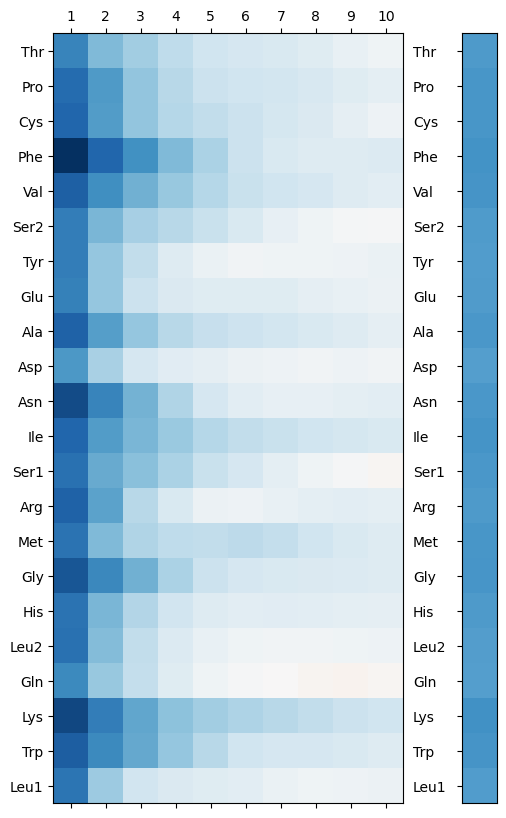

In [68]:
plt.figure(figsize=(10,10))

plt.subplot(121)
plt.matshow(
    wt_seq_ss.apply(
        lambda row: pd.Series([moransI(
            mithril_df.query("aa=='%s'"%row.name).groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
            graph_distance_matrix(row.graph).repeat(3, axis=0).repeat(3, axis=1)<=i,
            row_normalize=True, return_pvalue=False
        ) for i in range(1,11)], index=np.arange(1,11)),
        axis=1
    ),
    vmin=-.75, vmax=.75, cmap="RdBu", fignum=0
)
plt.yticks(range(len(wt_seq_ss)), wt_seq_ss.index, )
plt.tick_params(axis='y', which='both', labelleft='off', labelright='on')
plt.xticks(range(10), range(1,11))


plt.subplot(1,10,6)
plt.matshow(
    wt_seq_ss.apply(
        lambda row: moransI(
            mithril_df.query("aa=='%s'"%row.name).groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
            graph_similarity_matrix(row.graph).repeat(3, axis=0).repeat(3, axis=1),
            row_normalize=True, return_pvalue=False, n_permutations=None
        ),
        axis=1
    ).values[:,None],
    fignum=0, cmap="Blues", vmin=-.75, vmax=.75
)
plt.xticks([])
plt.yticks(range(len(wt_seq_ss)), [None]*len(wt_seq_ss))

plt.show()

In [69]:
lisa_df = pd.DataFrame(columns=["LISA", "pvalue"], index = pd.MultiIndex.from_tuples([], names=["aa", "gene.position"]))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    l, p = lisa(
        df.groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_similarity_matrix(wt_seq_ss.loc[aa_id, "graph"]).repeat(3, axis=0).repeat(3, axis=1),
        row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
    )
    p = p.reshape(-1,3).max(axis=1)
    l = l.reshape(-1,3).mean(axis=1)
    df = pd.DataFrame([l, p], index=["LISA", "pvalue"]).T
    df.index = pd.MultiIndex.from_product([[aa_id], np.arange(1, len(l)+1)])
    lisa_df = pd.concat([lisa_df, df], axis=0)
lisa_df.index.names = ["aa", "gene.position"]
lisa_df = lisa_df.join(mithril_df.groupby(["aa", "gene.position"]).tAPOGEE_score_posFree.mean())
lisa_df = lisa_df.join(mithril_df.groupby(["aa", "gene.position"]).Gene_symbol.first())
lisa_df = lisa_df.reset_index().set_index(["Gene_symbol", "gene.position"])[["LISA","pvalue","tAPOGEE_score_posFree"]]
lisa_df

/tmp/ipykernel_2606572/1868081467.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  lisa_df = pd.concat([lisa_df, df], axis=0)


LISA    pvalue  tAPOGEE_score_posFree
Gene_symbol gene.position                                           
MT-TF       1              0.002072  0.012705               0.787540
            2              0.000669  0.531140               0.631540
            3              0.000058  0.966336               0.526872
            4             -0.000058  0.988441               0.486512
            5             -0.000123  0.898130               0.461546
...                             ...       ...                    ...
MT-TP       64             0.000391  0.559915               0.596382
            65             0.000568  0.744338               0.597140
            66             0.002112  0.008160               0.733599
            67             0.002546  0.004533               0.761479
            68             0.000472  0.700355               0.590045

[1507 rows x 3 columns]

In [70]:
lisa_df.to_csv("../checkpoints/lisa.csv", sep="\t")

In [71]:
lisa_df.query("LISA>0 & pvalue<0.05")

LISA    pvalue  tAPOGEE_score_posFree
Gene_symbol gene.position                                           
MT-TF       1              0.002072  0.012705               0.787540
            10             0.001693  0.000000               0.793867
            16             0.002146  0.007100               0.264284
            17             0.003716  0.000000               0.175260
            18             0.002208  0.004347               0.302510
...                             ...       ...                    ...
MT-TP       54             0.002918  0.001943               0.281574
            55             0.002968  0.000000               0.272858
            56             0.002041  0.012000               0.331468
            66             0.002112  0.008160               0.733599
            67             0.002546  0.004533               0.761479

[188 rows x 3 columns]

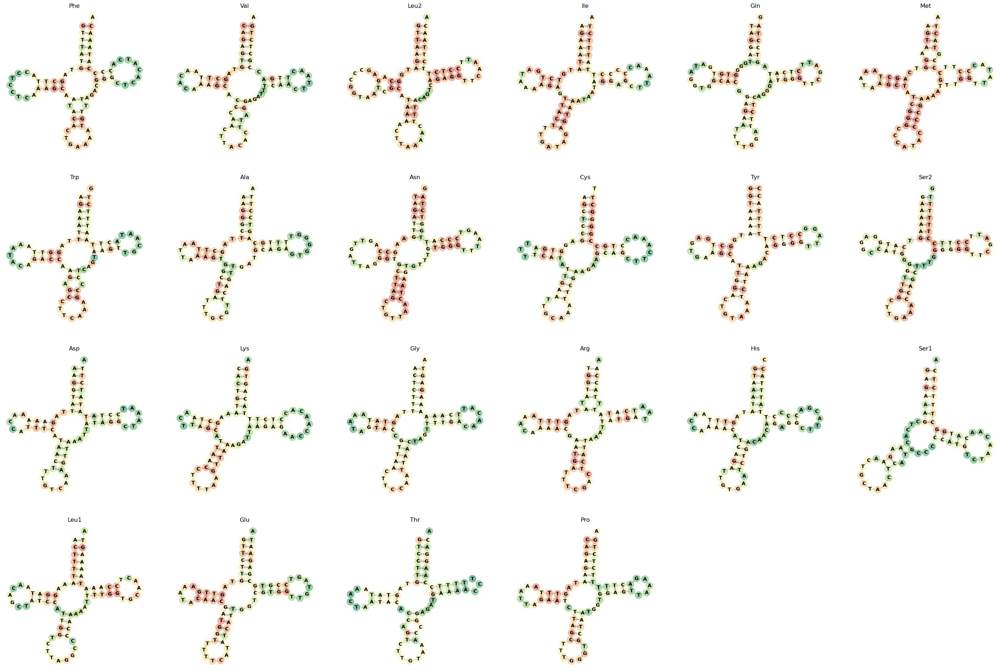

In [72]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").tAPOGEE_score.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

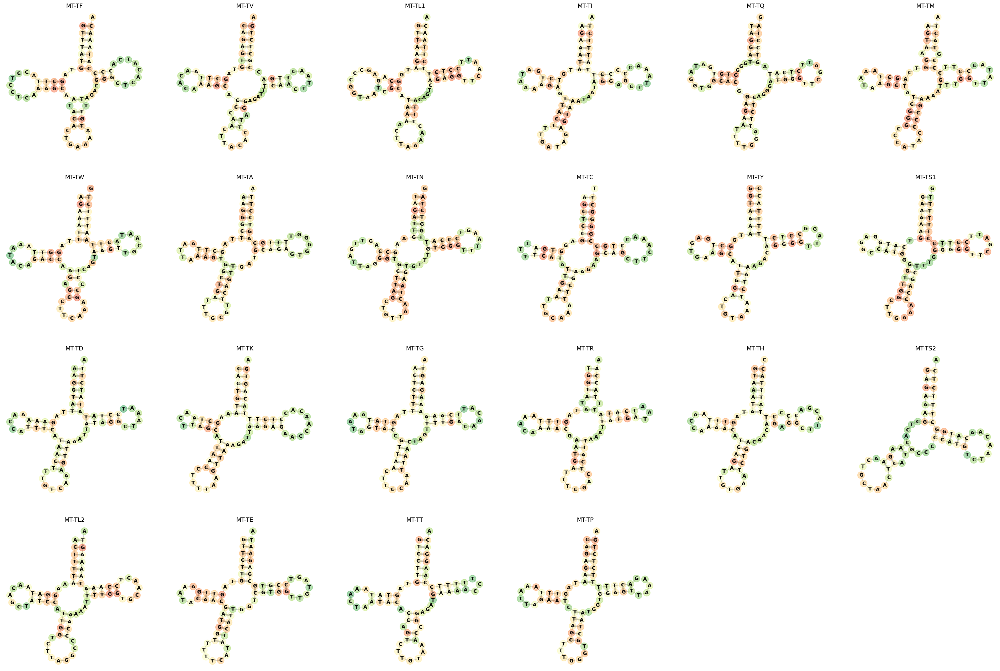

In [73]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(mithril_df.loc[mithril_df.aa==aa_id, "Gene_symbol"].values[0])
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").tAPOGEE_score_posFree.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

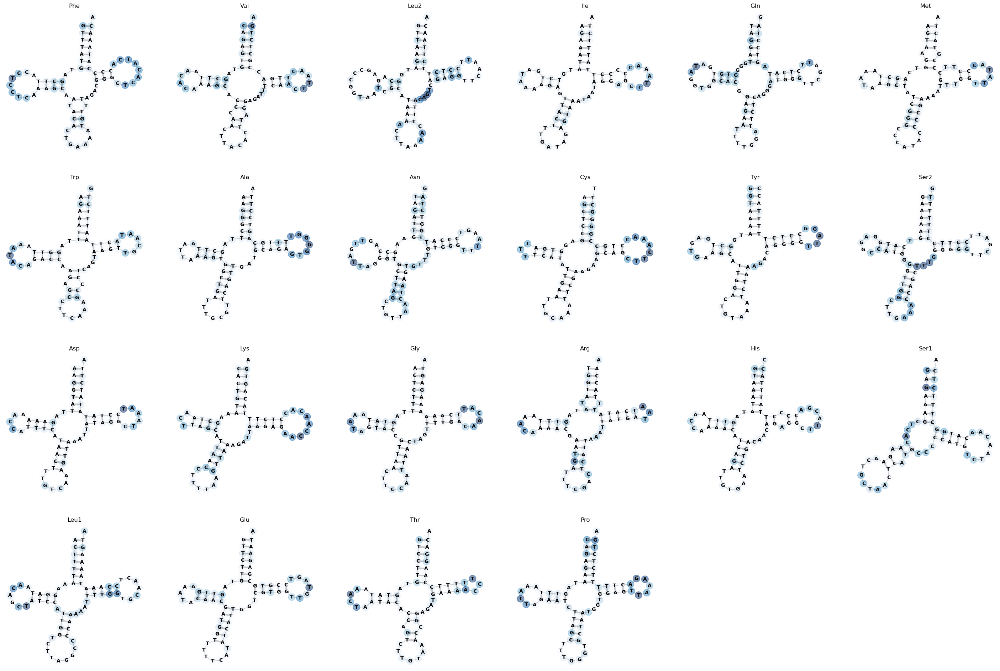

In [74]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"Blues", "vmin":0,
            "c":lisa(
                df.groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
                graph_similarity_matrix(wt_seq_ss.loc[aa_id, "graph"]).repeat(3, axis=0).repeat(3, axis=1),
                row_normalize=True
            ).reshape(-1,3).sum(axis=1)
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

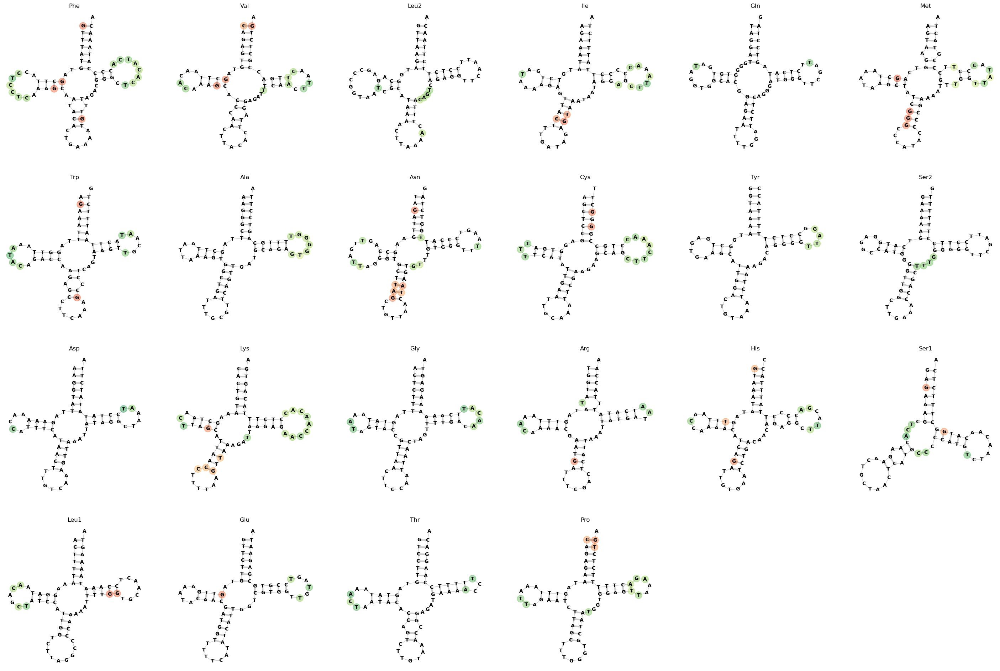

In [75]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    l, p = lisa(
        df.groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_similarity_matrix(wt_seq_ss.loc[aa_id, "graph"]).repeat(3, axis=0).repeat(3, axis=1),
        row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
    )
    p[l<0] = 1. # this because we don't want negative correlation to be showed in this plot.
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").tAPOGEE_score_posFree.mean()/(p.reshape(-1,3).max(axis=1)<.05)
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

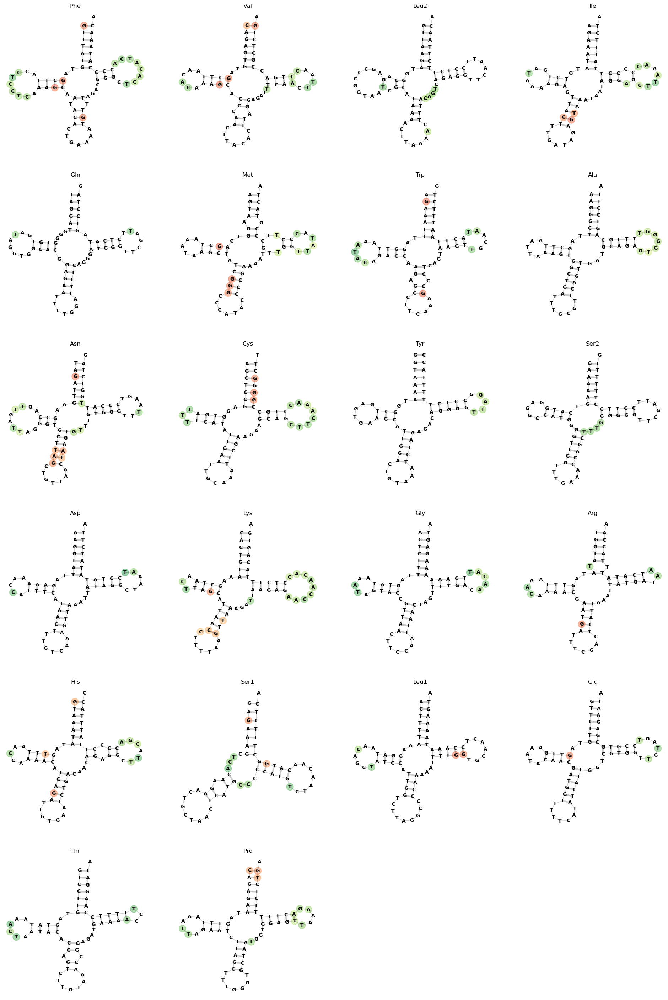

In [76]:
vertical = True
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    l, p = lisa(
        df.groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_similarity_matrix(wt_seq_ss.loc[aa_id, "graph"]).repeat(3, axis=0).repeat(3, axis=1),
        row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
    )
    p[l<0] = 1. # this if we don't want negative correlation to be showed.
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").tAPOGEE_score_posFree.mean()/(p.reshape(-1,3).max(axis=1)<.05)
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

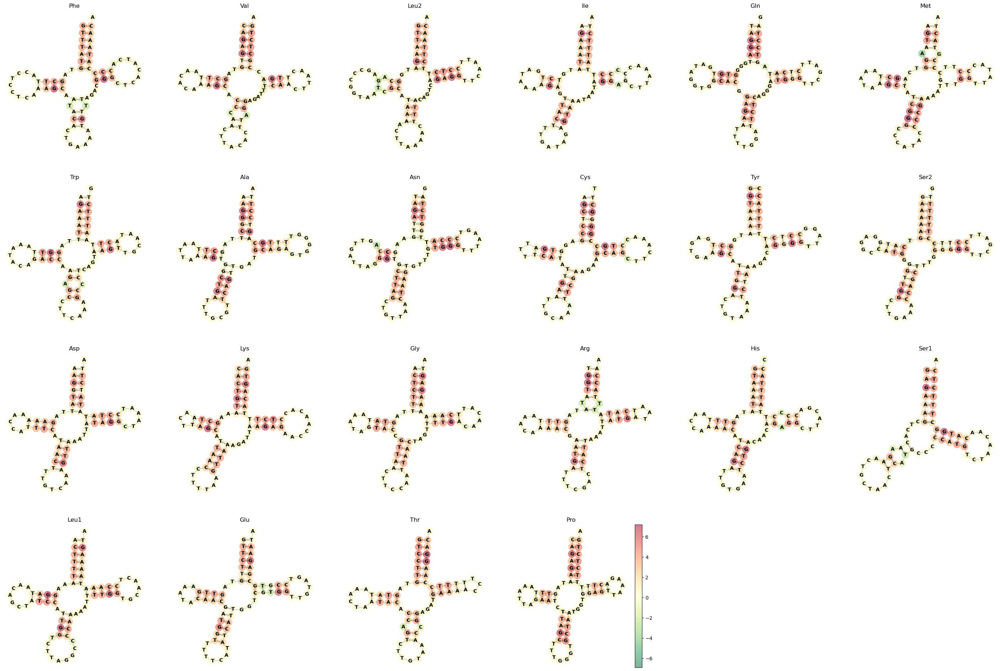

In [77]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":mithril_df.ddG.min(), "vmax":mithril_df.ddG.max(),
            "c":df.groupby("gene.position").ddG.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.colorbar()
plt.show()

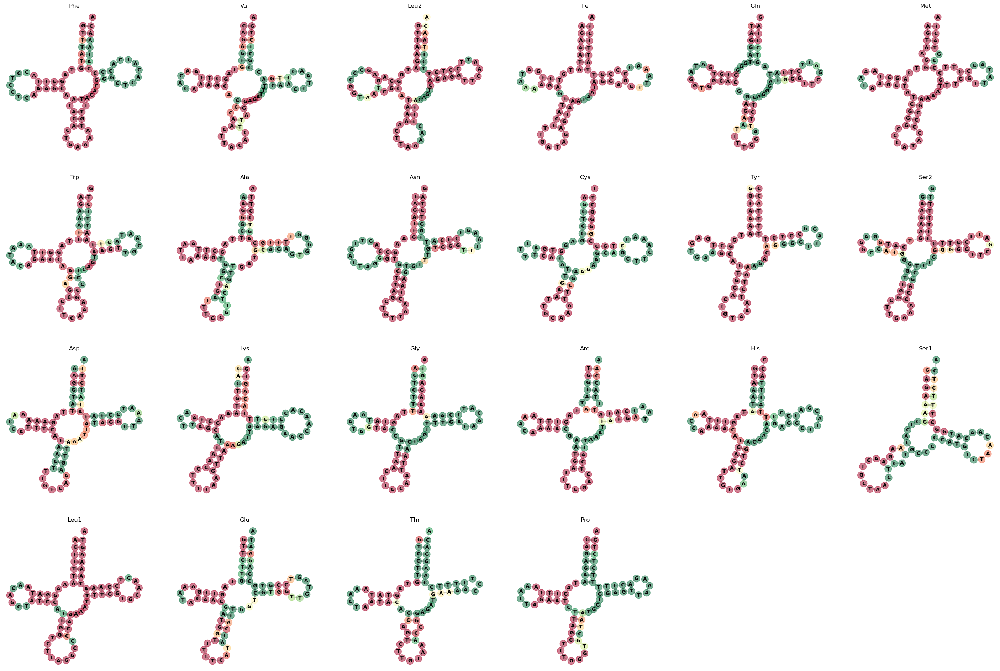

In [78]:
vertical = False
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").PhastCons_100V.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

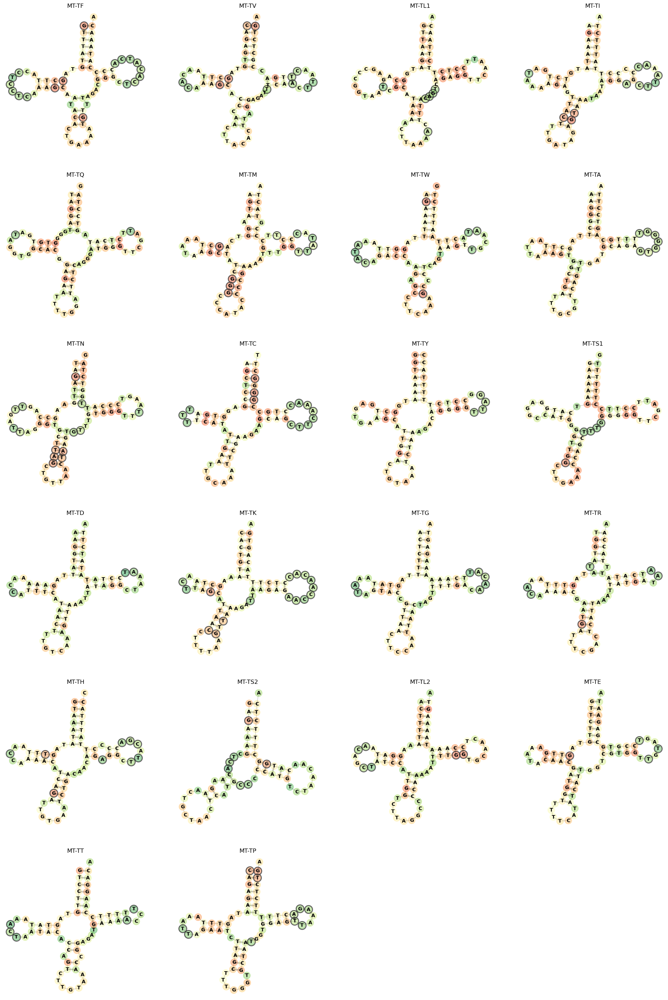

In [83]:
vertical = True
if vertical:
    plt.figure(figsize=(4*6,6*6))
else:
    plt.figure(figsize=(6*6, 4*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    l, p = lisa(
        df.groupby("gene.position").tAPOGEE_score_posFree.apply(pd.Series).values,
        graph_similarity_matrix(wt_seq_ss.loc[aa_id, "graph"]).repeat(3, axis=0).repeat(3, axis=1),
        row_normalize=True, return_pvalue=True, n_permutations=10_000, adjust_pvalues=True
    )
    p = p.reshape(-1,3).max(axis=1)
    l = l.reshape(-1,3).mean(axis=1)
    p[l<0] = 1. # this if we don't want negative correlation to be showed.

    if vertical:
        plt.subplot(6,4,i+1)
    else:
        plt.subplot(4,6,i+1)
    plt.axis("off")
    plt.title(mithril_df.loc[mithril_df.aa==aa_id, "Gene_symbol"].values[0])
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
            "c":df.groupby("gene.position").tAPOGEE_score_posFree.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        },
        highlight_nt=np.argwhere((l>0) & (p<.05)).flatten(),
        highlight_args={
            "color":(0,0,0,0), "edgecolors":(.2,.2,.2,.75), "linewidth":2, "s":250
        }
    )
plt.savefig("../../figures/svg/LISA_tRNA.svg", bbox_inches='tight')
plt.show()

domains


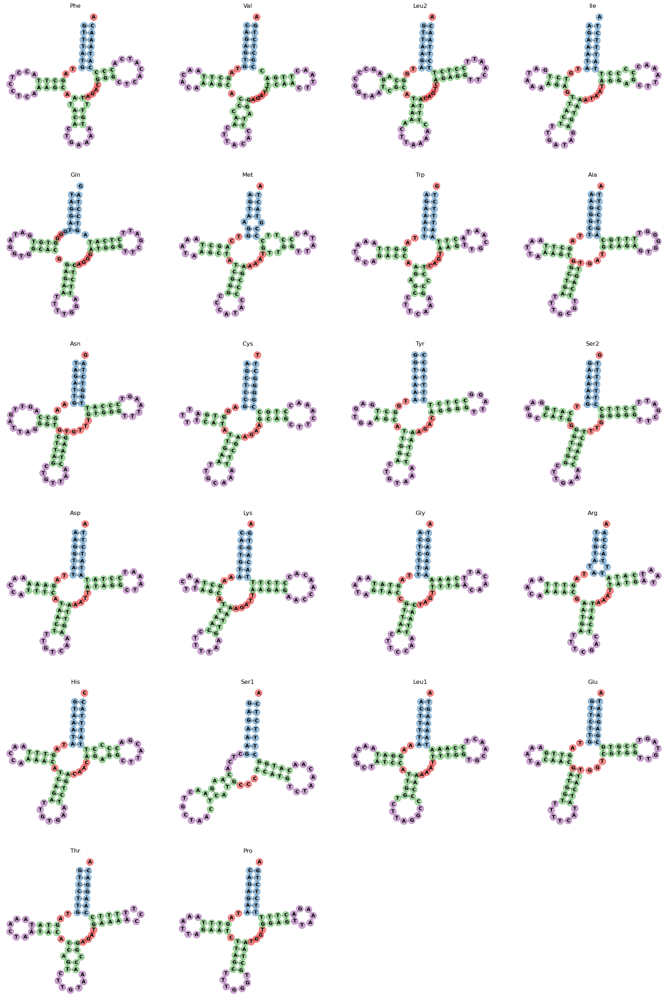

In [80]:
print("domains")
plt.figure(figsize=(4*6,6*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    plt.subplot(6,4,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"Set1", "vmin":0, "vmax":9, # Set1 has 9 categorical levels
            "c":(df.groupby("gene.position").first()[['bulge', 'stem', 'hairpin', 'loop']]*np.arange(4)).sum(axis=1)
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

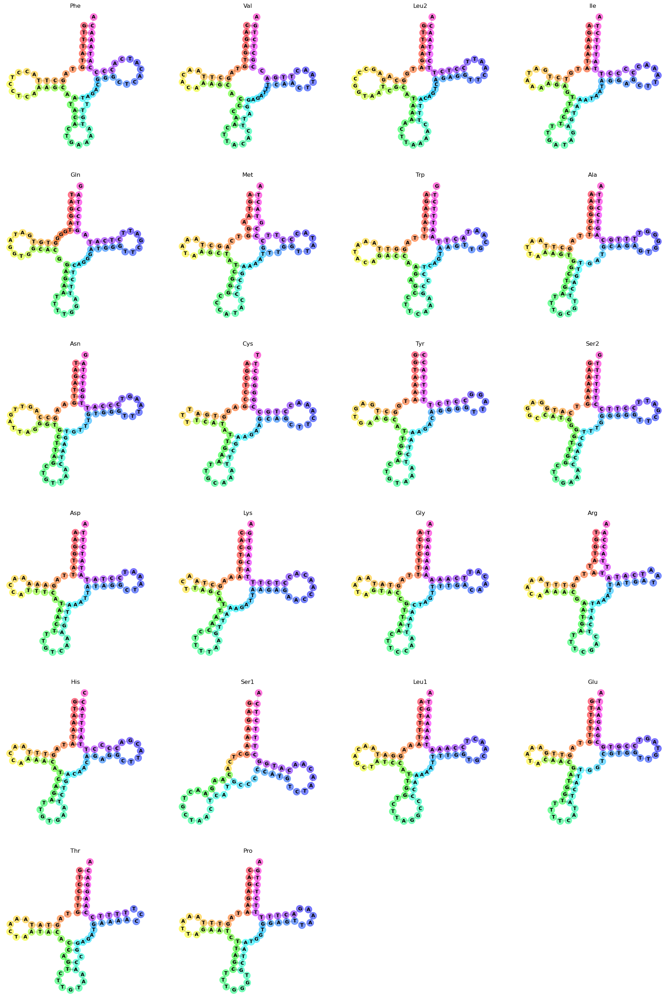

In [81]:
plt.figure(figsize=(4*6,6*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    plt.subplot(6,4,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"gist_rainbow",
            "c":df.groupby("gene.position").Human_MSA_position.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.show()

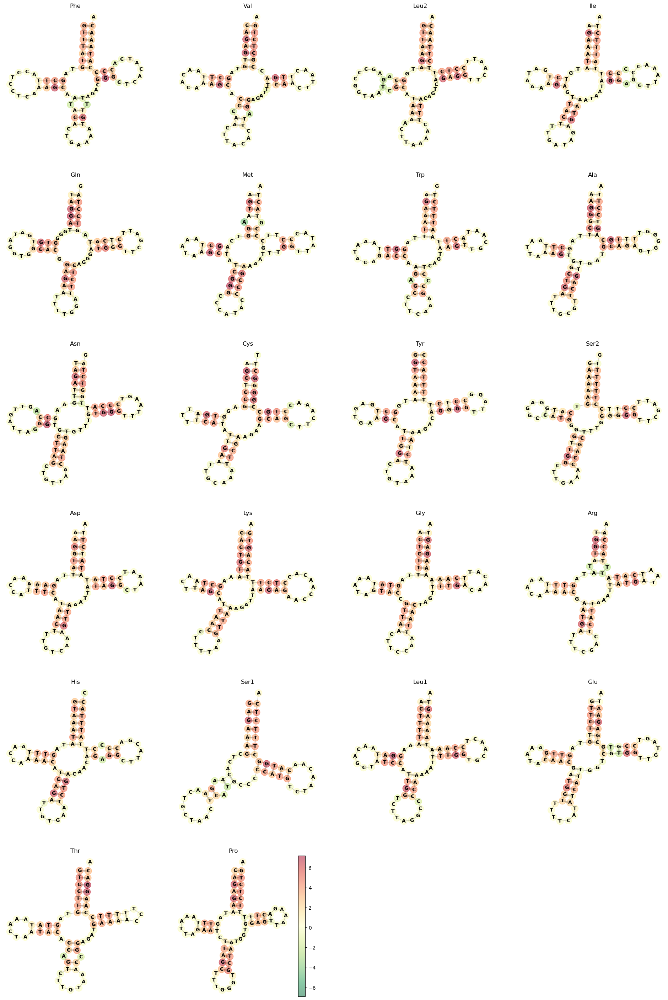

In [82]:
plt.figure(figsize=(4*6,6*6))
for i, aa_id in enumerate(mithril_df.aa.unique()):
    df = mithril_df.query("aa=='%s'"%aa_id)
    plt.subplot(6,4,i+1)
    plt.axis("off")
    plt.title(aa_id)
    plot_ps(
        "wt_ss_figures/"+aa_id+"_ss.ps",
        backbone_args={
            "color":"k", "linewidth":1, "alpha":.2
        },
        nt_args={
            "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":mithril_df.ddG.min(), "vmax":mithril_df.ddG.max(),
            "c":df.groupby("gene.position").ddG.mean()
        },
        pairs_args={
            "color":"k", "linewidth":3, "alpha":.2
        },
        text_args={
            "fontweight":"bold"
        }
    )
plt.colorbar()
plt.show()

In [83]:
########################################
###### some exaples of annotation ######
########################################

Start                                                                   3271
Ref                                                                        T
Alt                                                                        C
class                                                                   tRNA
Gene_symbol                                                           MT-TL1
extended.annotation        TRNL1; mitochondrially encoded tRNA-Leu (UUA/G) 1
gene.position                                                             42
gene.start                                                              3230
gene.end                                                                3304
gene.strand                                                                +
PhastCons_100V                                                         0.983
PhyloP_100V                                                            2.982
MLC_score                                                           0.729314

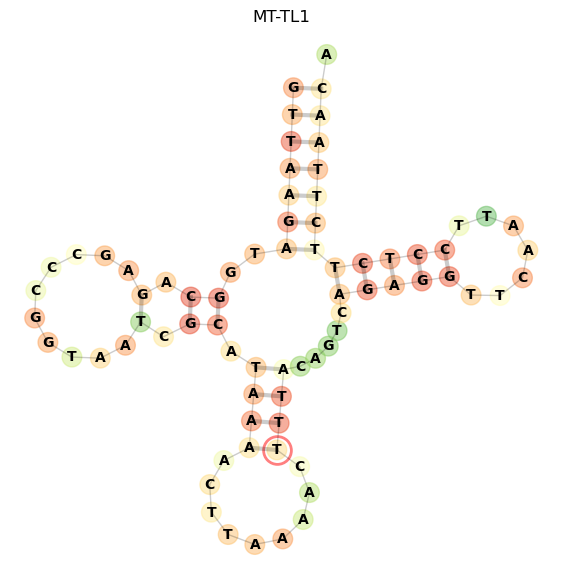

In [84]:
def annotate(variant_id, verbose=True, plot=True, return_annotation=False):
    if variant_id not in mithril_df.index: # m.3271T>C
        parsed_variant_id = variant_id.strip().split(".")[-1]
        try:
            pos, ref, alt = re.findall("^([0-9]+)([ATGC])>([ATGC])", parsed_variant_id)[0]
            pos = int(pos)
        except IndexError:
            try:
                pos = int(re.findall("^([0-9]+)$", parsed_variant_id)[0])
                ref, alt = None, None
            except:
                raise ValueError("invalid id: %s"%variant_id)
        
        if (not ref is None) and (not alt is None):
            selection = mithril_df.loc[
                (mithril_df.Start==pos) & (mithril_df.Ref==ref) & ((mithril_df.Alt==alt))
            ]
        else:
            selection = mithril_df.loc[
                (mithril_df.Start==pos)
            ]

        if len(selection)<1:
            raise ValueError("%s is not a mt-tRNA SNV"%variant_id)
        
        if plot:
            aas = selection.aa.unique()
            for i, aa_id in enumerate(aas):
                gene_position = selection.loc[selection.aa==aa_id, "gene.position"].values[0]-1
                gene_strand = selection.loc[selection.aa==aa_id, "gene.strand"].values[0]
                # if gene_strand=="-":
                #     gene_position = -gene_position-1
                df = mithril_df.query("aa=='%s'"%aa_id)
                plt.figure(figsize=(7,7))
                plt.axis("off")
                plt.title(aa2gene.loc[aa_id])
                plot_ps(
                    "wt_ss_figures/"+aa_id+"_ss.ps",
                    backbone_args={
                        "color":"k", "linewidth":1, "alpha":.2
                    },
                    nt_args={
                        "s":200, "alpha":.5, "cmap":"RdYlGn_r", "vmin":0, "vmax":1,
                        "c":df.groupby("gene.position").tAPOGEE_score.mean()
                    },
                    pairs_args={
                        "color":"k", "linewidth":3, "alpha":.2
                    },
                    text_args={
                        "fontweight":"bold"
                    },
                    highlight_nt=gene_position,
                    highlight_args={
                        "color":(0,0,0,0), "edgecolors":(1,0,0,.5), "linewidth":2, "s":400
                    }
                )
    if verbose:
        with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
            selection.apply(print, axis=1)
    if return_annotation:
        return selection

annotate("m.3271T>C")

Start                                                                4330
Ref                                                                     T
Alt                                                                     C
class                                                                tRNA
Gene_symbol                                                         MT-TI
extended.annotation        TRNI; mitochondrially encoded tRNA-Ile (AUU/C)
gene.position                                                          68
gene.start                                                           4263
gene.end                                                             4331
gene.strand                                                             +
PhastCons_100V                                                        1.0
PhyloP_100V                                                         5.766
MLC_score                                                        0.498552
modification                          

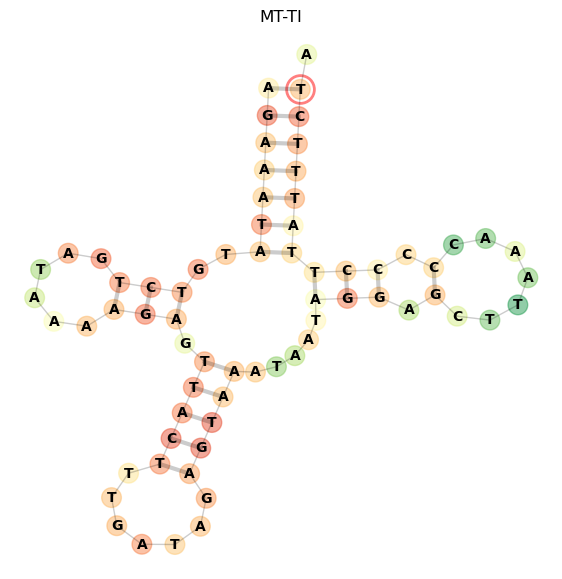

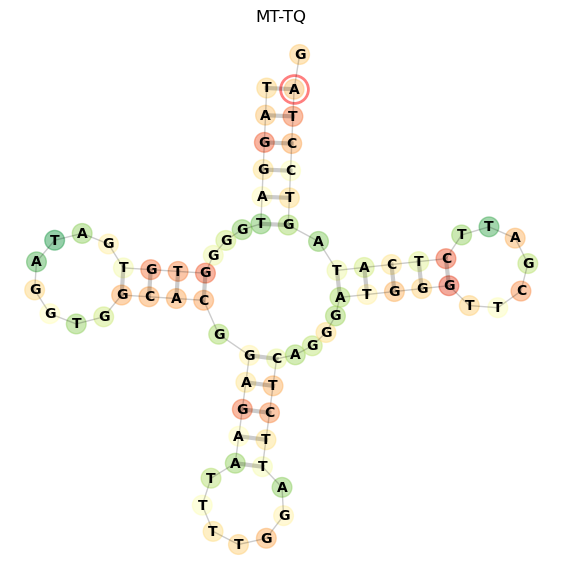

In [85]:
annotate("m.4330T>C")

Start                                                                4329
Ref                                                                     C
Alt                                                                     A
class                                                                tRNA
Gene_symbol                                                         MT-TI
extended.annotation        TRNI; mitochondrially encoded tRNA-Ile (AUU/C)
gene.position                                                          67
gene.start                                                           4263
gene.end                                                             4331
gene.strand                                                             +
PhastCons_100V                                                        1.0
PhyloP_100V                                                         4.266
MLC_score                                                        0.493271
modification                          

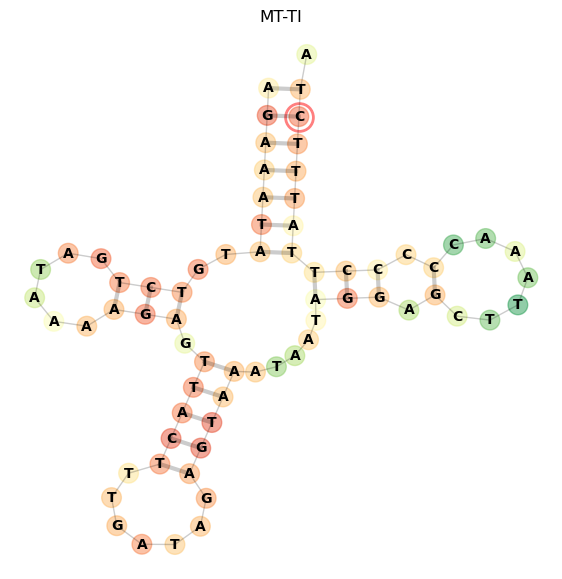

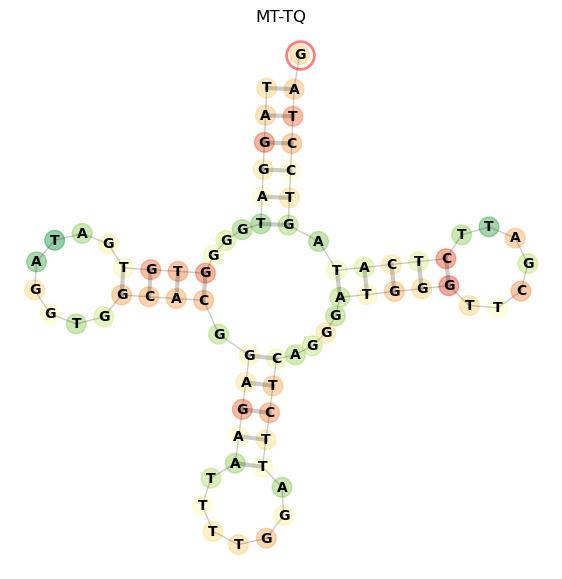

In [86]:
annotate("m.4329")

Start                                                                4331
Ref                                                                     A
Alt                                                                     C
class                                                                tRNA
Gene_symbol                                                         MT-TI
extended.annotation        TRNI; mitochondrially encoded tRNA-Ile (AUU/C)
gene.position                                                          69
gene.start                                                           4263
gene.end                                                             4331
gene.strand                                                             +
PhastCons_100V                                                        1.0
PhyloP_100V                                                         5.587
MLC_score                                                        0.505009
modification                          

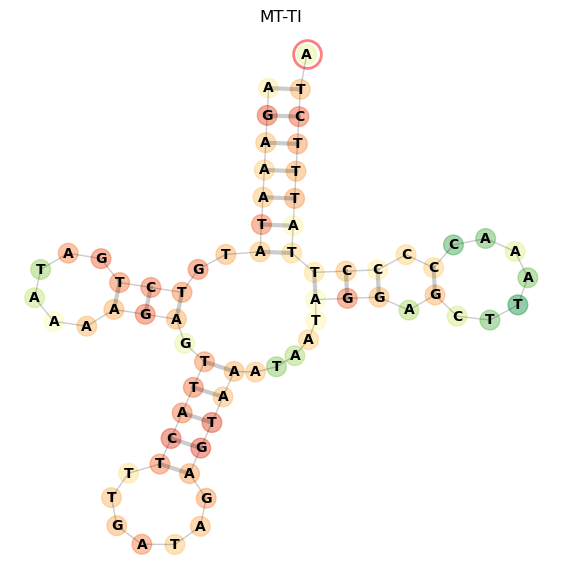

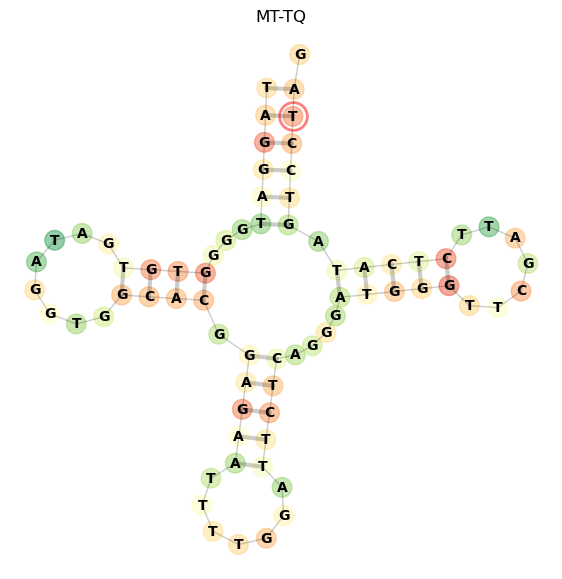

In [87]:
annotate("m.4331")

Start                                                                   3271
Ref                                                                        T
Alt                                                                        C
class                                                                   tRNA
Gene_symbol                                                           MT-TL1
extended.annotation        TRNL1; mitochondrially encoded tRNA-Leu (UUA/G) 1
gene.position                                                             42
gene.start                                                              3230
gene.end                                                                3304
gene.strand                                                                +
PhastCons_100V                                                         0.983
PhyloP_100V                                                            2.982
MLC_score                                                           0.729314

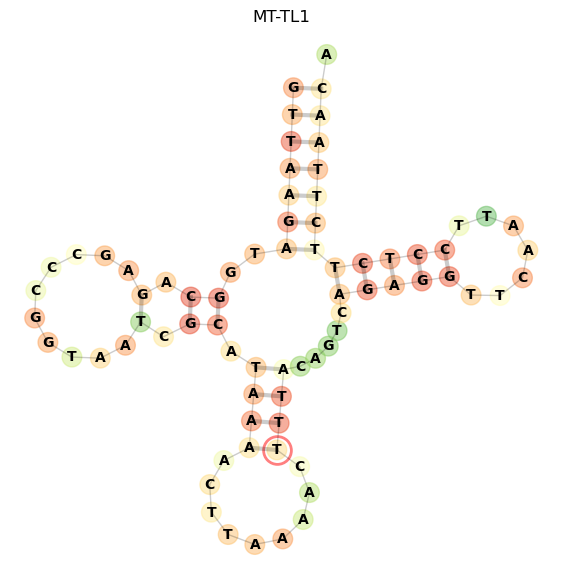

In [88]:
annotate("m.3271T>C")

Start                                                             15992
Ref                                                                   A
Alt                                                                   T
class                                                              tRNA
Gene_symbol                                                       MT-TP
extended.annotation        TRNP; mitochondrially encoded tRNA-Pro (CCN)
gene.position                                                        32
gene.start                                                        15956
gene.end                                                          16023
gene.strand                                                           -
PhastCons_100V                                                      1.0
PhyloP_100V                                                       8.592
MLC_score                                                      0.517503
modification                                                    

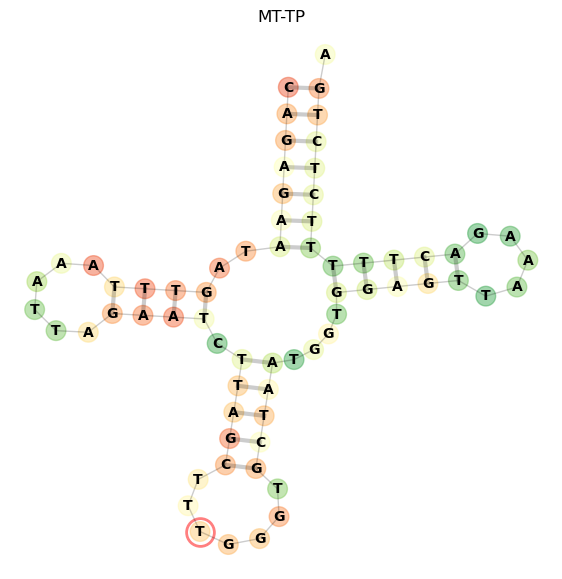

In [89]:
annotate("m.15992A>T")

Start                                                                5729
Ref                                                                     A
Alt                                                                     C
class                                                                tRNA
Gene_symbol                                                         MT-TN
extended.annotation        TRNN; mitochondrially encoded tRNA-Asn (AAU/C)
gene.position                                                           1
gene.start                                                           5657
gene.end                                                             5729
gene.strand                                                             -
PhastCons_100V                                                        1.0
PhyloP_100V                                                         6.846
MLC_score                                                        0.774036
modification                          

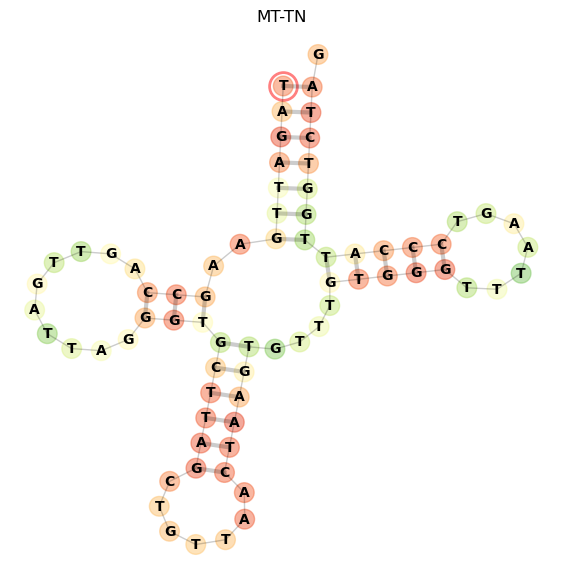

In [90]:
annotate("m.5729A>C")